# **Required Dependencies**

In [566]:
!pip install ydata-profiling  pytorch-tabnet torch tab-transformer-pytorch -q

In [567]:
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score,roc_curve, auc, precision_recall_curve
import warnings
from pytorch_tabnet.tab_model import TabNetClassifier
import torch
from tab_transformer_pytorch import TabTransformer
from torch.utils.data import DataLoader, TensorDataset
import torch.optim as optim
from pytorch_tabnet.tab_model import TabNetClassifier
import torch.nn as nn
from sklearn.preprocessing import StandardScaler, LabelEncoder
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.regularizers import l2
warnings.filterwarnings('ignore')

# **File Upload**

In [568]:
from google.colab import files
uploaded = files.upload()

Saving dataset.csv to dataset (14).csv


# **Data overview**

In [569]:
df=pd.read_csv(list(uploaded.keys())[0])
df.shape

(1000, 15)

## Datasets Samples

In [570]:
df.sample(5)

,Customer_ID,Age,Gender,Annual_Income,Total_Spend,Years_as_Customer,Num_of_Purchases,Average_Transaction_Amount,Num_of_Returns,Num_of_Support_Contacts,Satisfaction_Score,Last_Purchase_Days_Ago,Email_Opt_In,Promotion_Response,Target_Churn
618,619,28,Male,118.90,9625.49,18,96,82.88,7,1,1,90,False,Unsubscribed,False
939,940,41,Female,59.16,9289.26,2,46,445.68,2,3,3,21,True,Ignored,True
114,115,68,Other,76.45,8878.16,19,84,135.89,7,0,5,332,False,Ignored,False
953,954,33,Female,103.35,8154.08,10,18,264.97,4,0,1,75,True,Unsubscribed,False
62,63,56,Female,94.48,4331.87,5,31,207.30,9,2,4,251,False,Ignored,False


## Missing Values

In [571]:
df.isnull().sum()

,0
Customer_ID,0
Age,0
Gender,0
Annual_Income,0
Total_Spend,0
Years_as_Customer,0
Num_of_Purchases,0
Average_Transaction_Amount,0
Num_of_Returns,0
Num_of_Support_Contacts,0


## Data info

In [572]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 15 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Customer_ID                 1000 non-null   int64  
 1   Age                         1000 non-null   int64  
 2   Gender                      1000 non-null   object 
 3   Annual_Income               1000 non-null   float64
 4   Total_Spend                 1000 non-null   float64
 5   Years_as_Customer           1000 non-null   int64  
 6   Num_of_Purchases            1000 non-null   int64  
 7   Average_Transaction_Amount  1000 non-null   float64
 8   Num_of_Returns              1000 non-null   int64  
 9   Num_of_Support_Contacts     1000 non-null   int64  
 10  Satisfaction_Score          1000 non-null   int64  
 11  Last_Purchase_Days_Ago      1000 non-null   int64  
 12  Email_Opt_In                1000 non-null   bool   
 13  Promotion_Response          1000 n

In [573]:
df.describe(include=[object])

,Gender,Promotion_Response
count,1000,1000
unique,3,3
top,Female,Unsubscribed
freq,342,361


## Summary Statistics of Numerical Features

In [574]:
df.describe()

,Customer_ID,Age,Annual_Income,Total_Spend,Years_as_Customer,Num_of_Purchases,Average_Transaction_Amount,Num_of_Returns,Num_of_Support_Contacts,Satisfaction_Score,Last_Purchase_Days_Ago
count,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,500.500000,43.267000,111.962960,5080.79265,9.727000,49.456000,266.876530,4.612000,1.934000,2.974000,182.890000
std,288.819436,15.242311,52.844111,2862.12335,5.536346,28.543595,145.873445,2.896869,1.402716,1.391855,104.391319
min,1.000000,18.000000,20.010000,108.94000,1.000000,1.000000,10.460000,0.000000,0.000000,1.000000,1.000000
25%,250.750000,30.000000,67.800000,2678.67500,5.000000,25.000000,139.682500,2.000000,1.000000,2.000000,93.000000
50%,500.500000,43.000000,114.140000,4986.19500,9.000000,49.000000,270.100000,5.000000,2.000000,3.000000,180.500000
75%,750.250000,56.000000,158.452500,7606.47000,14.000000,74.000000,401.602500,7.000000,3.000000,4.000000,274.000000
max,1000.000000,69.000000,199.730000,9999.64000,19.000000,99.000000,499.570000,9.000000,4.000000,5.000000,364.000000


## Correlation of Target feature with all columns

In [575]:
df_numeric = df.drop(['Gender', 'Promotion_Response'], axis=1)
df_numeric.corr()["Target_Churn"]

,Target_Churn
Customer_ID,0.043034
Age,-0.009260
Annual_Income,-0.036322
Total_Spend,0.028659
Years_as_Customer,-0.029823
Num_of_Purchases,-0.032772
Average_Transaction_Amount,-0.024723
Num_of_Returns,0.000061
Num_of_Support_Contacts,0.009593
Satisfaction_Score,0.022567


## Pandas Profiling Report

In [576]:
profile = ProfileReport(df, title="Profiling Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 15/15 [00:00<00:00, 45.63it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# **Univariate Analysis**






In [577]:
def make_piechart(df, target_feature, additional=''):
    dict_of_val_counts = dict(df[target_feature].value_counts())
    data = list(dict_of_val_counts.values())
    keys = list(dict_of_val_counts.keys())

    palette_color = sns.color_palette('bright')
    plt.pie(data, labels=keys, colors=palette_color, autopct='%.0f%%')
    plt.title(f"Distribution of Cutomer's {target_feature}:")
    plt.show()
    print_str = f"Distribution of cutomer's {target_feature.lower()}{additional}:"
    for k, v in zip(keys, data):
        print_str += f"\n{v} {k}"
    print(print_str)

def make_barplot(df, target_feature, custom_ticks=None, unit='', additional=''):
    plt.figure(figsize=(10, 5))
    dict_of_val_counts = dict(df[target_feature].value_counts())
    data = list(dict_of_val_counts.values())
    keys = list(dict_of_val_counts.keys())
    plt.bar(keys, data)
    if custom_ticks is not None:
        plt.xticks(custom_ticks)
    plt.xlabel(f'{target_feature.capitalize()}{additional}')
    plt.ylabel('Frequency')
    plt.title(f"Distribution of cutomer's {target_feature.lower()}{additional}\n")
    plt.grid(axis='y')
    plt.show()
    print(f"Distribution of cutomer's {target_feature.lower()}{additional}: {df[target_feature].mean():.2f} ± {df[target_feature].median():.2f} {unit}\nMedian: {df[target_feature].median():.2f} {unit}\nMinimum: {df[target_feature].min()} {unit}\nMaximum: {df[target_feature].max()} {unit}\n\n{df[target_feature].skew():.3f} Skewness\n")

def make_boxplot(df, feature):
    plt.figure(figsize=(10,5))
    sns.boxplot(df, x=feature)
    plt.title(f"Boxplot of {feature}\n")
    plt.xlabel(feature)
    plt.ylabel("Values")
    plt.show()

def make_distplot(df, target_feature, bins=10, kde=True, unit='', additional=''):
    plt.figure(figsize=(10, 5))
    sns.histplot(df[target_feature], bins=bins, kde=kde)
    plt.xlabel(target_feature)
    plt.ylabel('Count')
    plt.title(f"Distribution of {target_feature.lower()}{additional}:\n")
    plt.grid()
    plt.show()
    print(f"Distribution of {target_feature.lower()}{additional}: {df[target_feature].mean():.2f} ± {df[target_feature].median():.2f} {unit}\nMedian: {df[target_feature].median():.2f} {unit}\nMinimum: {df[target_feature].min()} {unit}\nMaximum: {df[target_feature].max()} {unit}\nSkewness: {df[target_feature].skew():.3f}\n")


def make_countplot(df, target_feature, custom_order=None, palette='bright', additional=''):
    plt.figure(figsize=(10, 5))
    sns.countplot(data=df, x=target_feature, order=custom_order, palette=palette)
    plt.xlabel(f"{target_feature.capitalize()}{additional}")
    plt.ylabel('Count')
    plt.title(f"Count Plot of Customer's {target_feature.lower()}{additional}\n")
    plt.grid(axis='y')
    plt.show()

    # Print value counts
    value_counts = df[target_feature].value_counts()
    print_str = f"Distribution of Customer's {target_feature.lower()}{additional}:"
    for k, v in value_counts.items():
        print_str += f"\n{k}: {v}"
    print(print_str)



## Categorical data univariate Analysis

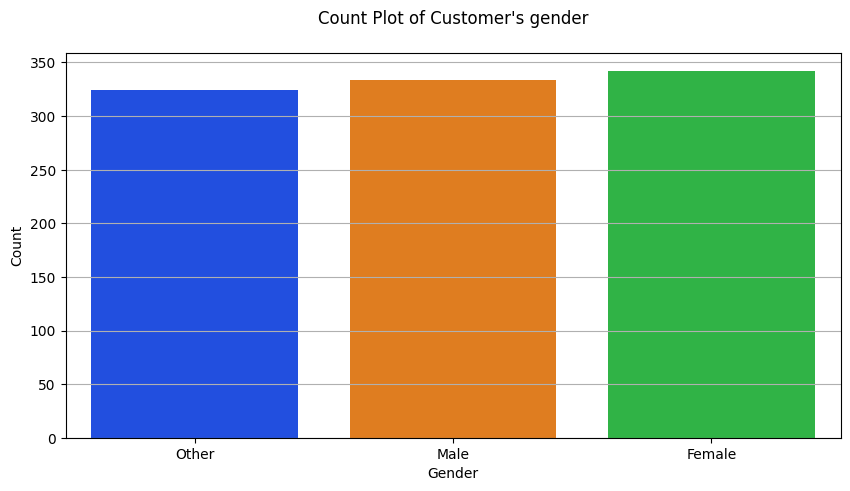

Distribution of Customer's gender:
Female: 342
Male: 334
Other: 324


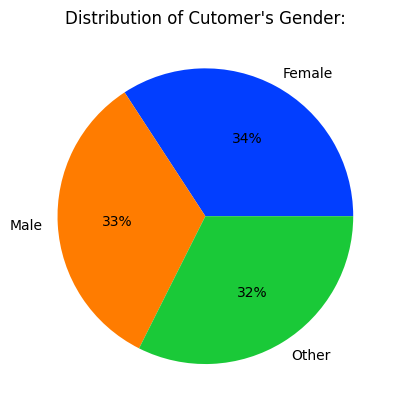

Distribution of cutomer's gender:
342 Female
334 Male
324 Other


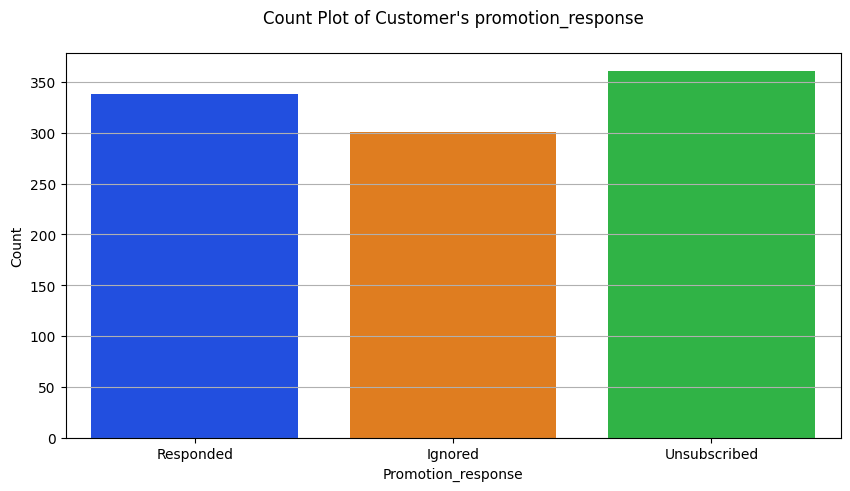

Distribution of Customer's promotion_response:
Unsubscribed: 361
Responded: 338
Ignored: 301


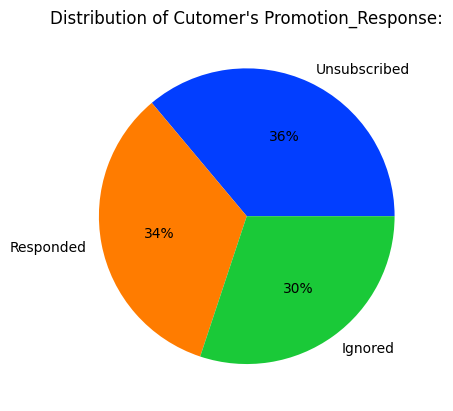

Distribution of cutomer's promotion_response:
361 Unsubscribed
338 Responded
301 Ignored


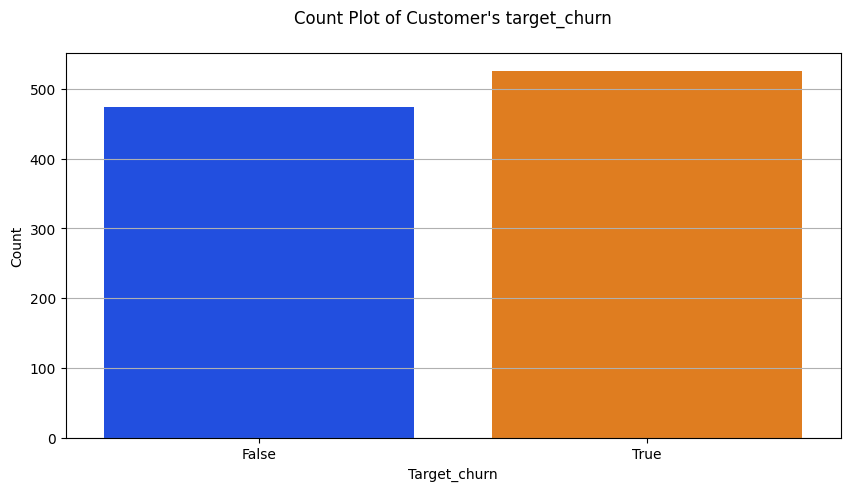

Distribution of Customer's target_churn:
True: 526
False: 474


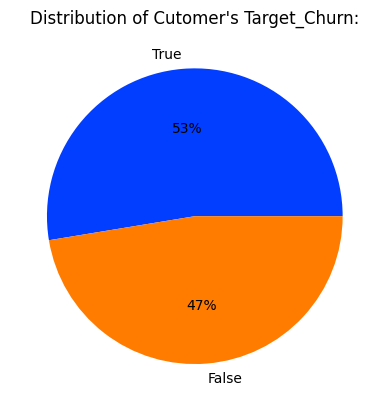

Distribution of cutomer's target_churn:
526 True
474 False


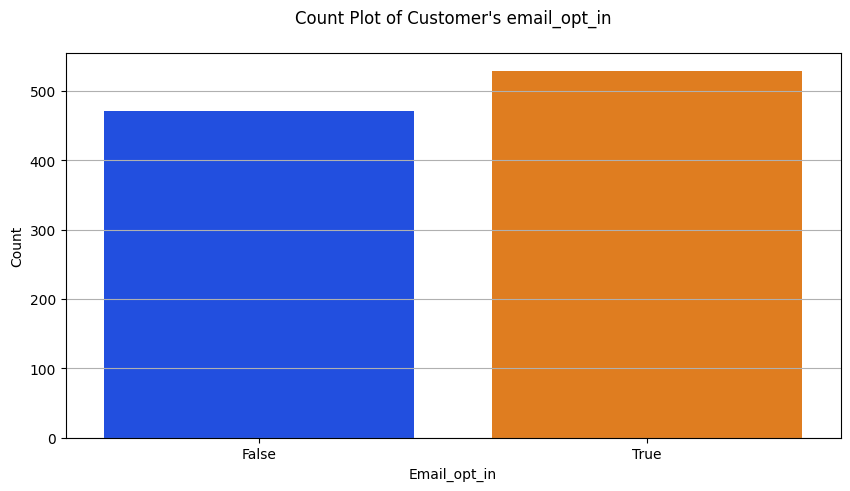

Distribution of Customer's email_opt_in:
True: 529
False: 471


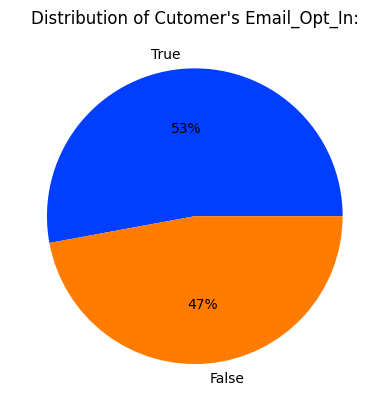

Distribution of cutomer's email_opt_in:
529 True
471 False


In [578]:
#For categorical data univariate analysis
make_countplot(df,"Gender")
make_piechart(df,"Gender")

make_countplot(df,"Promotion_Response")
make_piechart(df,"Promotion_Response")

make_countplot(df,"Target_Churn")
make_piechart(df,"Target_Churn")

make_countplot(df,"Email_Opt_In")
make_piechart(df,"Email_Opt_In")

## Numerical data univariate Analysis

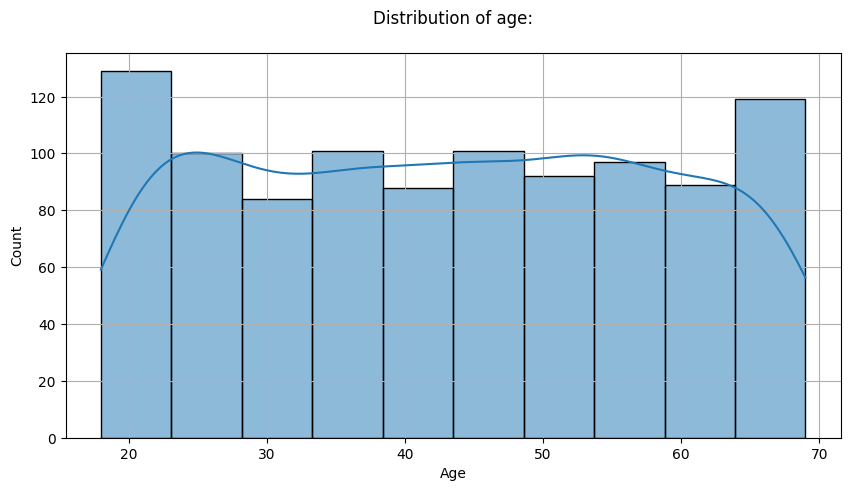

Distribution of age: 43.27 ± 43.00 
Median: 43.00 
Minimum: 18 
Maximum: 69 
Skewness: 0.013



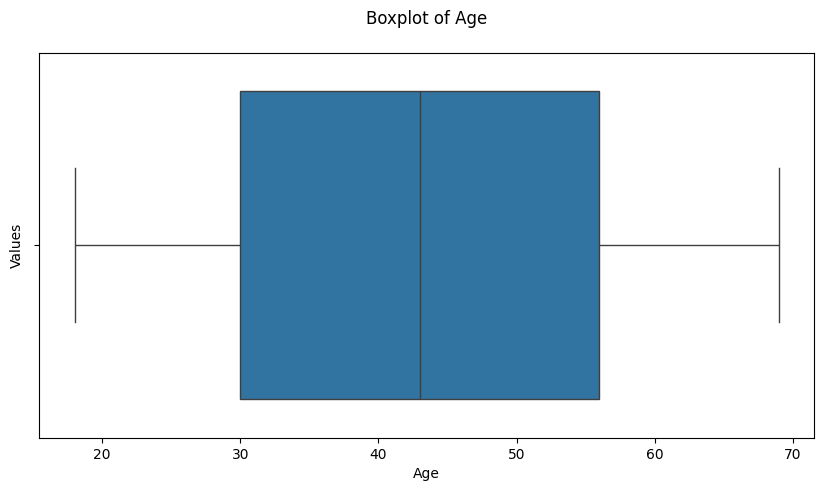

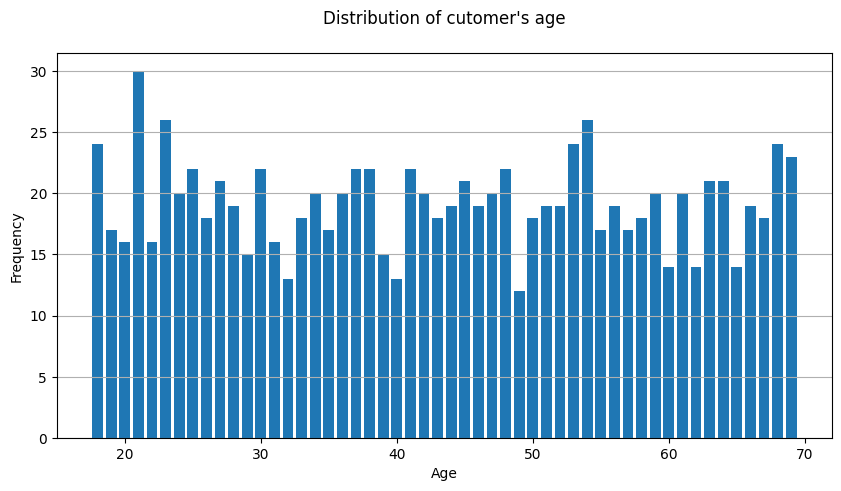

Distribution of cutomer's age: 43.27 ± 43.00 
Median: 43.00 
Minimum: 18 
Maximum: 69 

0.013 Skewness



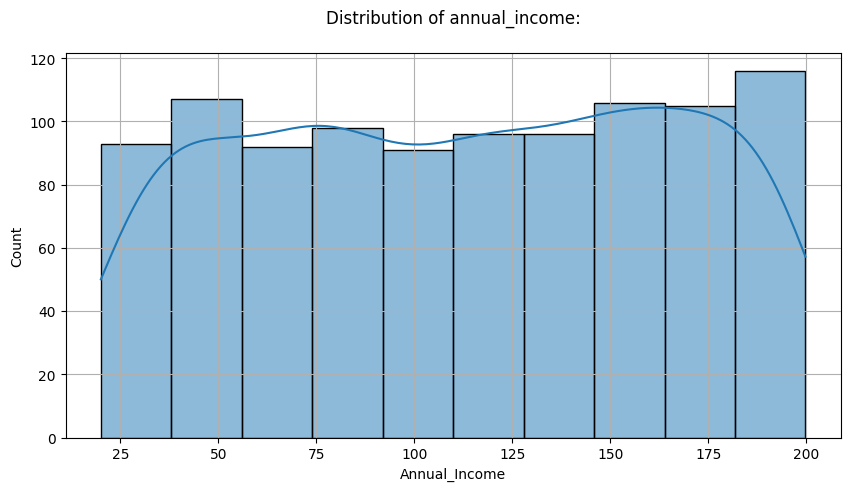

Distribution of annual_income: 111.96 ± 114.14 
Median: 114.14 
Minimum: 20.01 
Maximum: 199.73 
Skewness: -0.045



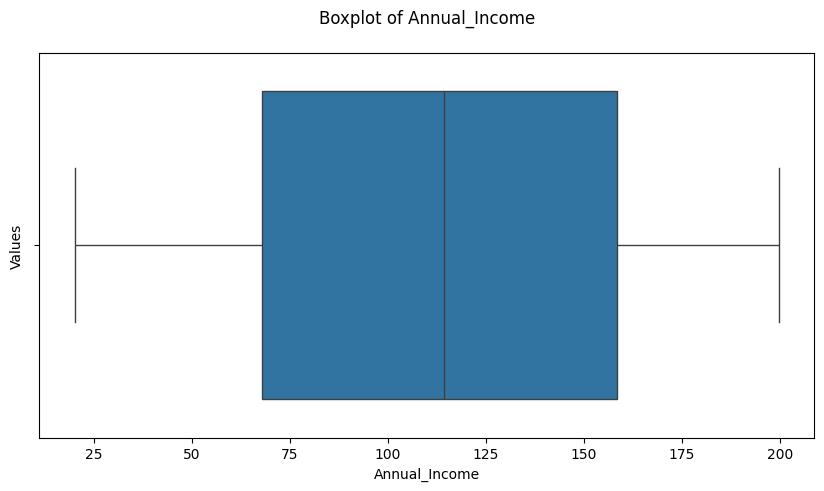

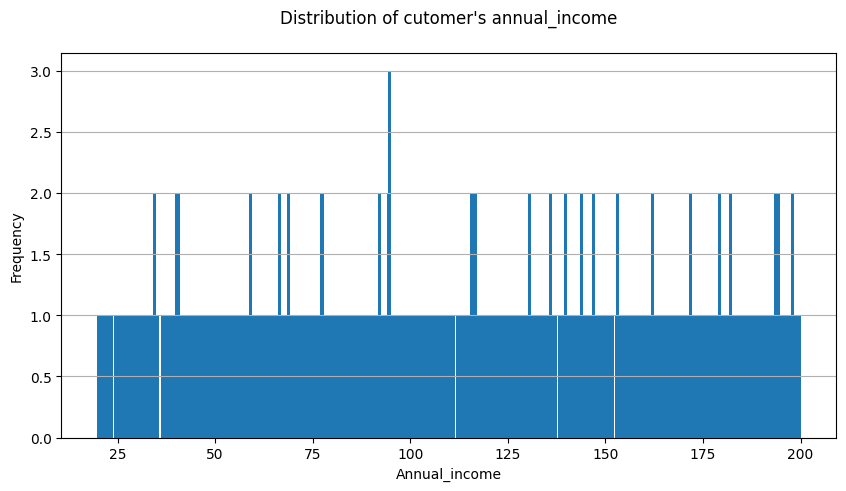

Distribution of cutomer's annual_income: 111.96 ± 114.14 
Median: 114.14 
Minimum: 20.01 
Maximum: 199.73 

-0.045 Skewness



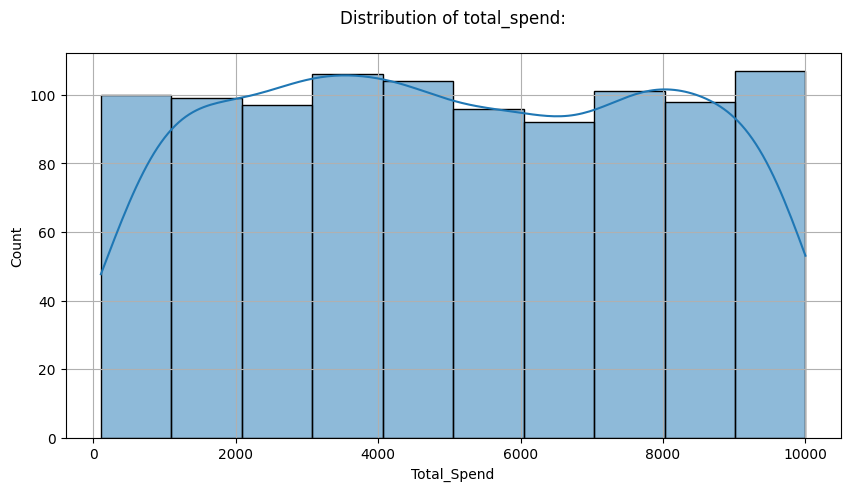

Distribution of total_spend: 5080.79 ± 4986.19 
Median: 4986.19 
Minimum: 108.94 
Maximum: 9999.64 
Skewness: 0.018



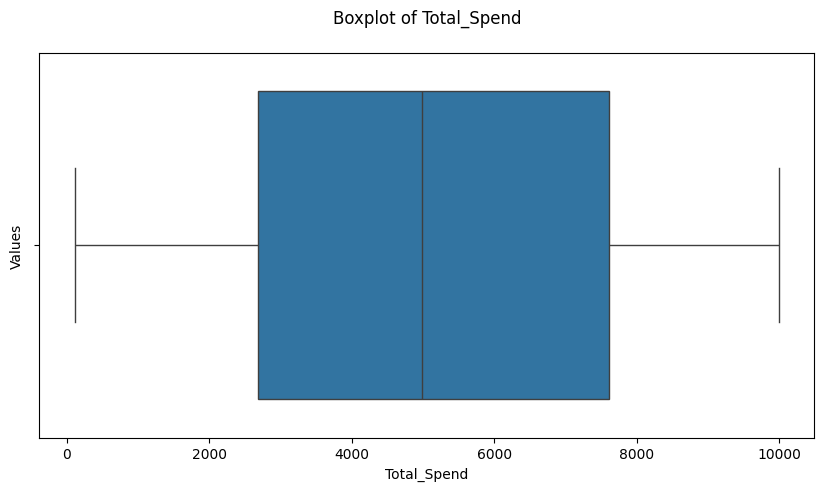

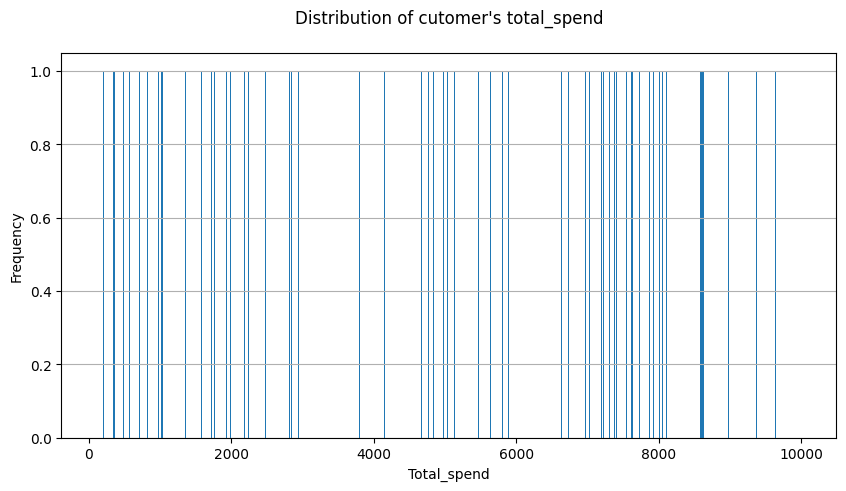

Distribution of cutomer's total_spend: 5080.79 ± 4986.19 
Median: 4986.19 
Minimum: 108.94 
Maximum: 9999.64 

0.018 Skewness



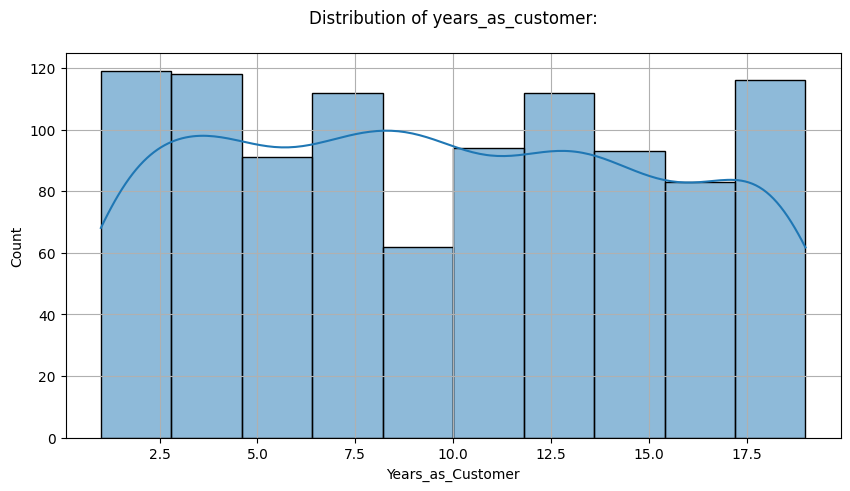

Distribution of years_as_customer: 9.73 ± 9.00 
Median: 9.00 
Minimum: 1 
Maximum: 19 
Skewness: 0.067



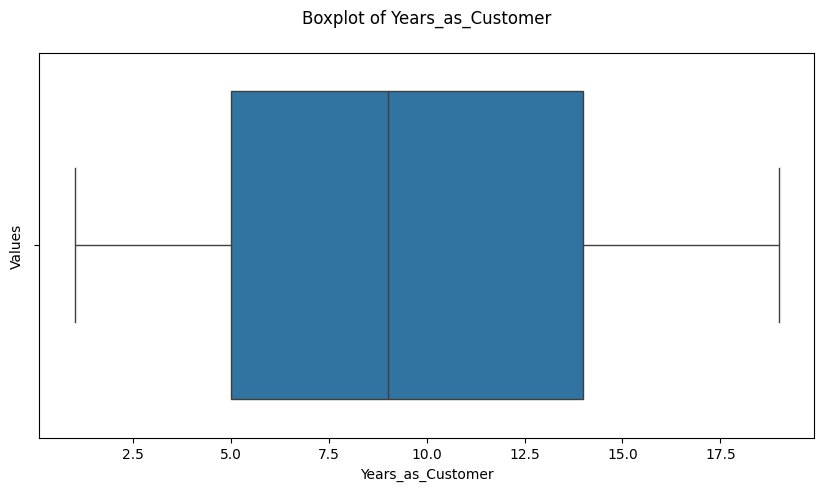

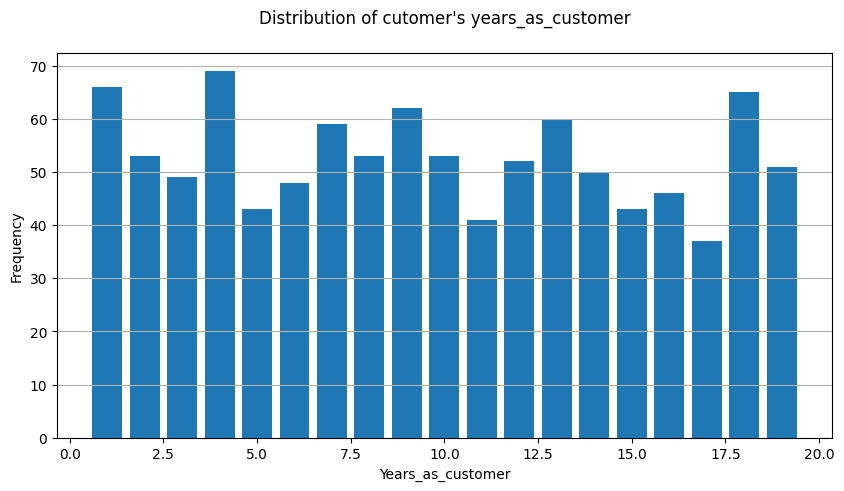

Distribution of cutomer's years_as_customer: 9.73 ± 9.00 
Median: 9.00 
Minimum: 1 
Maximum: 19 

0.067 Skewness



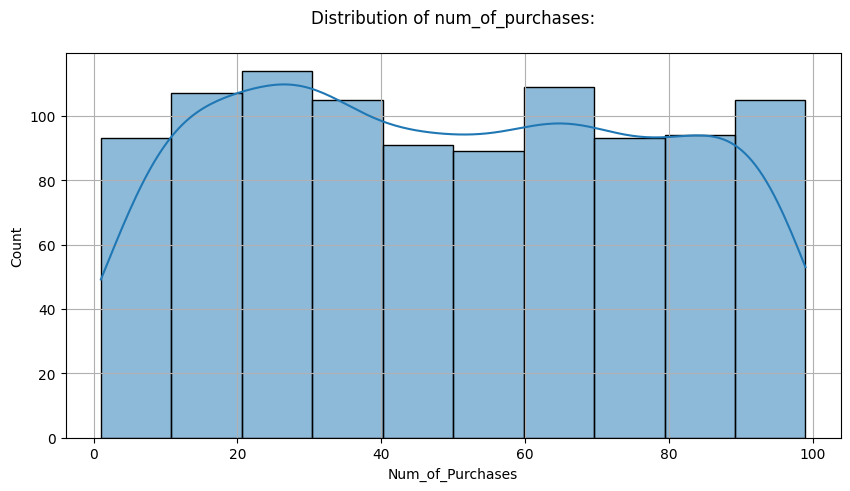

Distribution of num_of_purchases: 49.46 ± 49.00 
Median: 49.00 
Minimum: 1 
Maximum: 99 
Skewness: 0.060



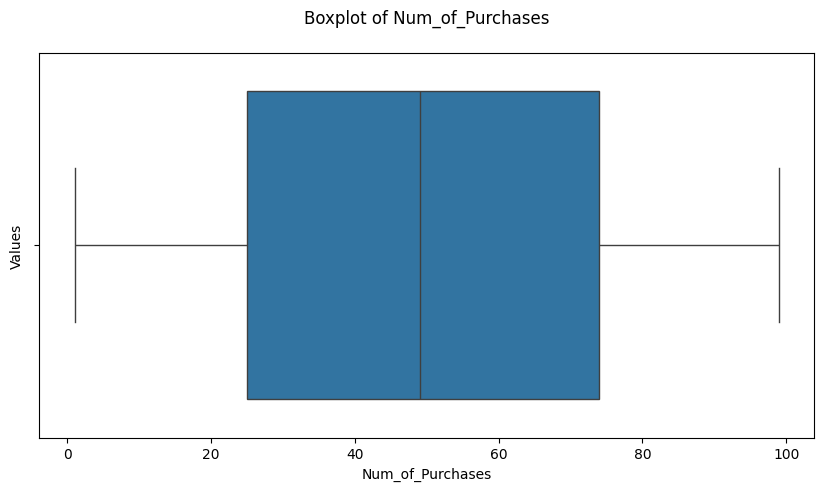

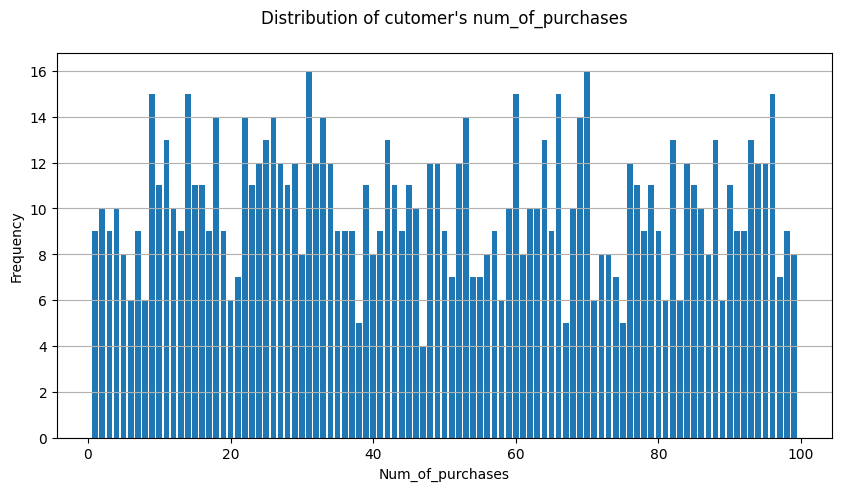

Distribution of cutomer's num_of_purchases: 49.46 ± 49.00 
Median: 49.00 
Minimum: 1 
Maximum: 99 

0.060 Skewness



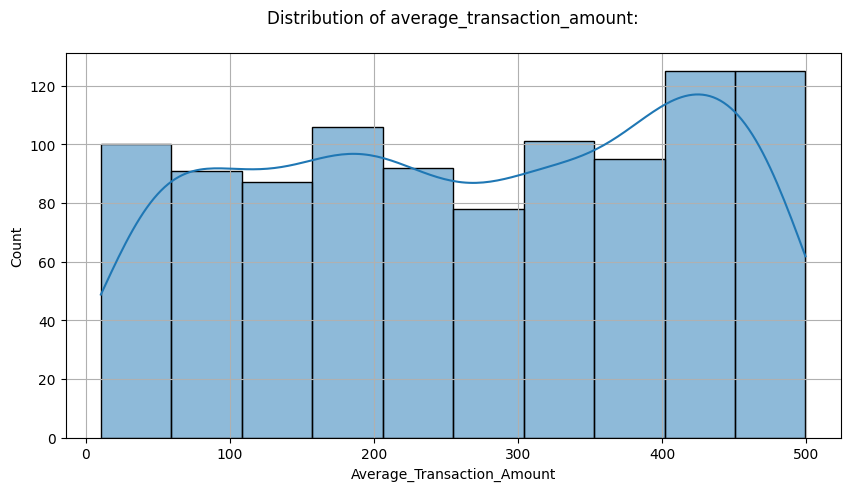

Distribution of average_transaction_amount: 266.88 ± 270.10 
Median: 270.10 
Minimum: 10.46 
Maximum: 499.57 
Skewness: -0.097



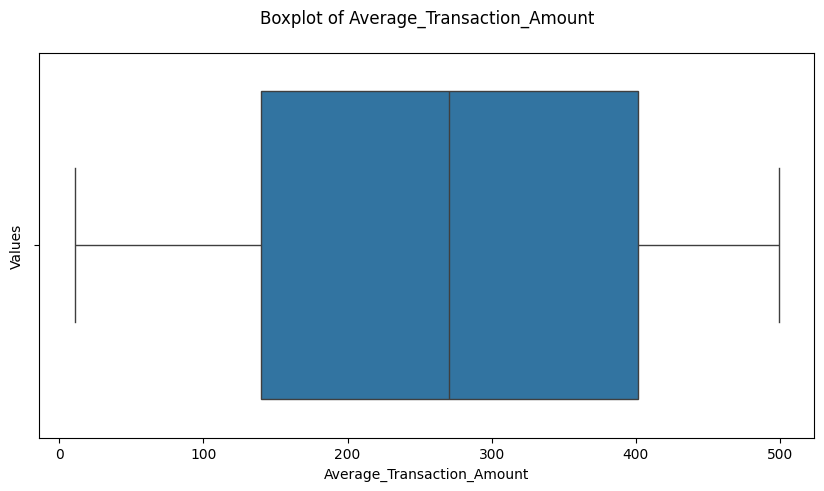

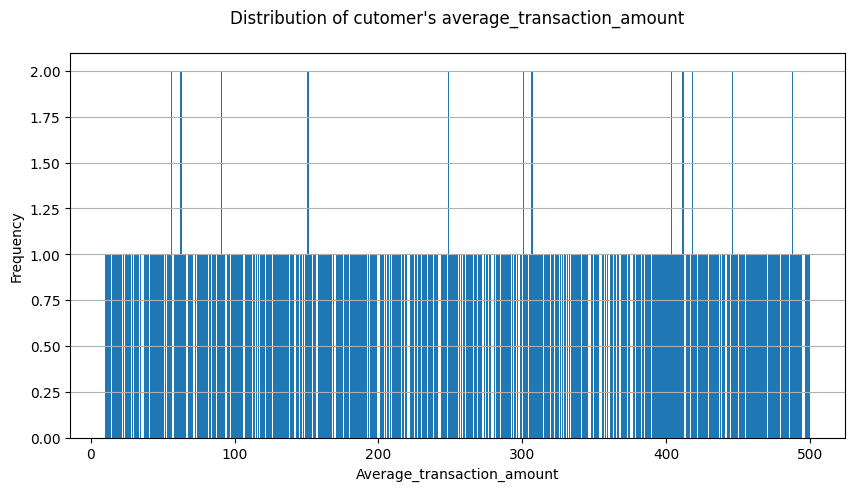

Distribution of cutomer's average_transaction_amount: 266.88 ± 270.10 
Median: 270.10 
Minimum: 10.46 
Maximum: 499.57 

-0.097 Skewness



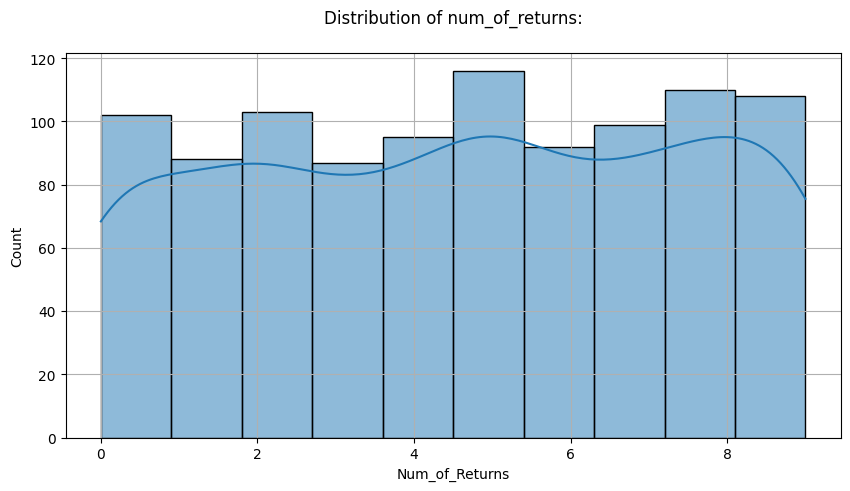

Distribution of num_of_returns: 4.61 ± 5.00 
Median: 5.00 
Minimum: 0 
Maximum: 9 
Skewness: -0.057



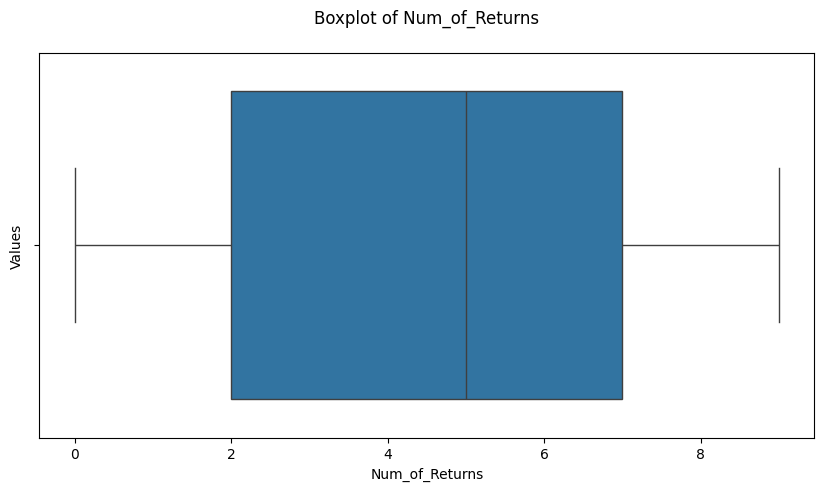

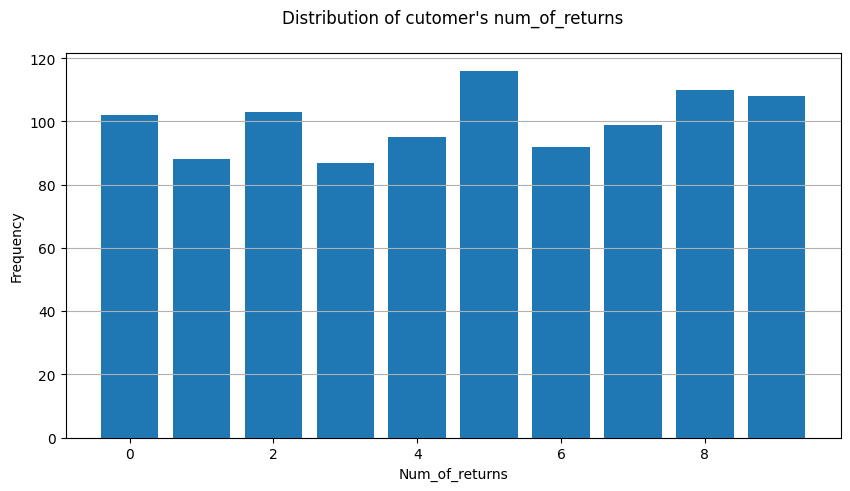

Distribution of cutomer's num_of_returns: 4.61 ± 5.00 
Median: 5.00 
Minimum: 0 
Maximum: 9 

-0.057 Skewness



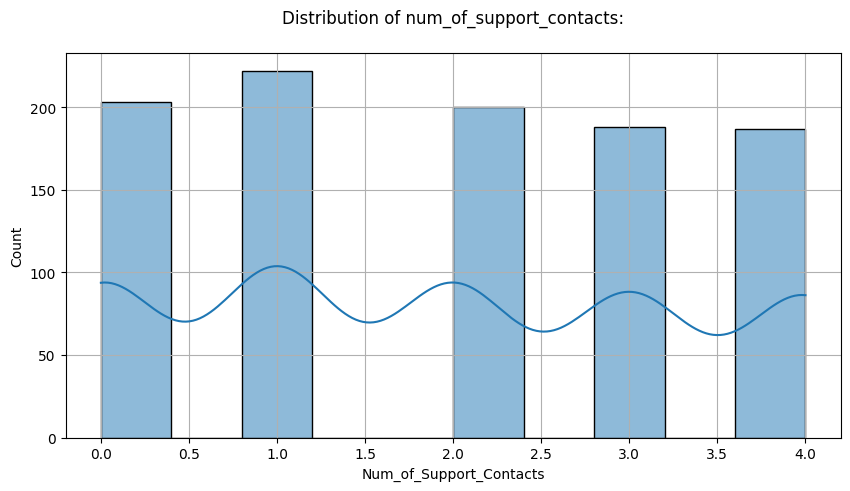

Distribution of num_of_support_contacts: 1.93 ± 2.00 
Median: 2.00 
Minimum: 0 
Maximum: 4 
Skewness: 0.083



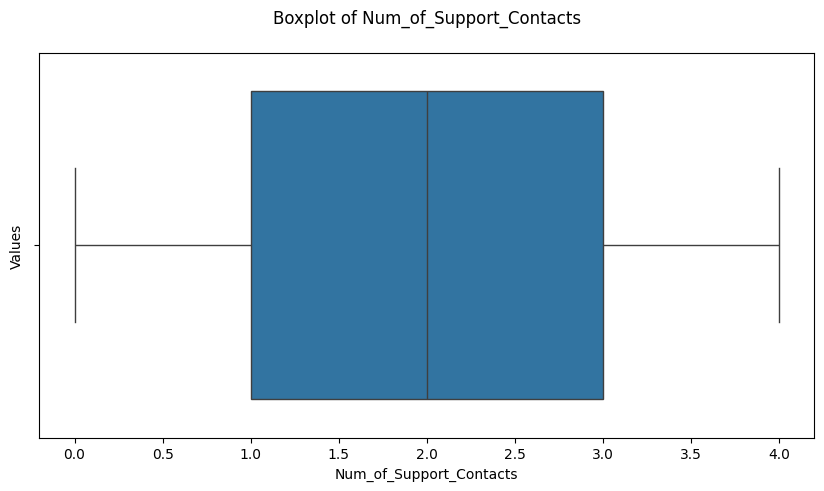

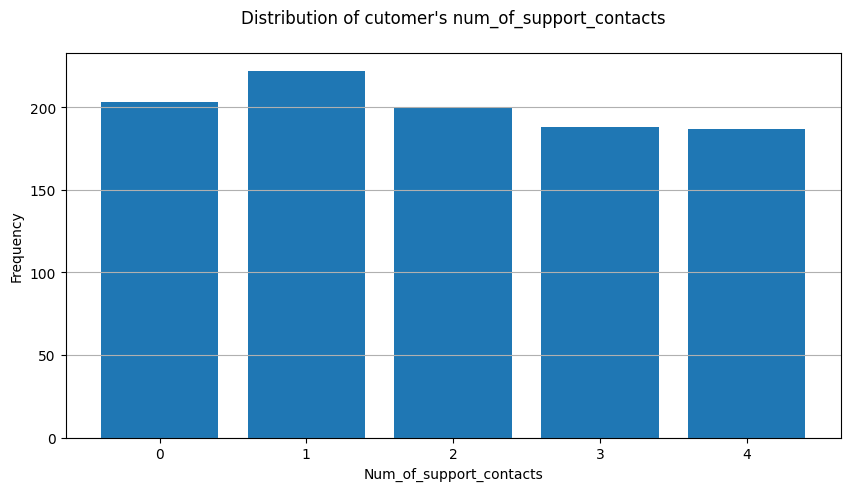

Distribution of cutomer's num_of_support_contacts: 1.93 ± 2.00 
Median: 2.00 
Minimum: 0 
Maximum: 4 

0.083 Skewness



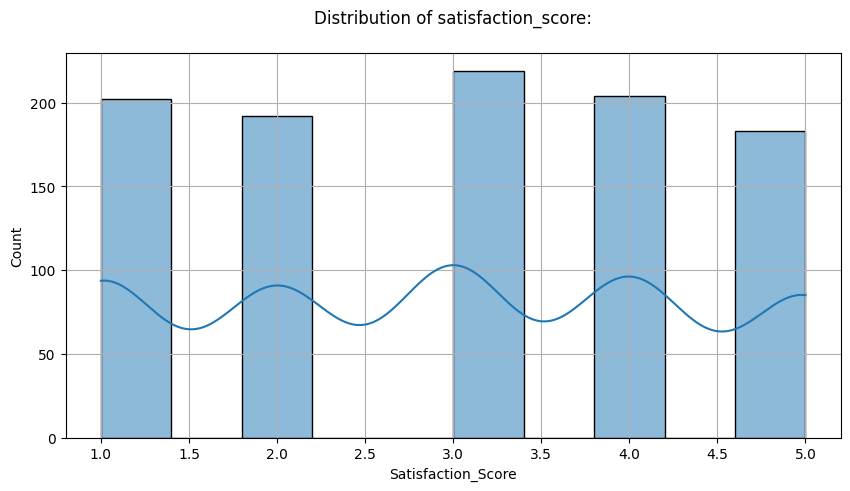

Distribution of satisfaction_score: 2.97 ± 3.00 
Median: 3.00 
Minimum: 1 
Maximum: 5 
Skewness: 0.004



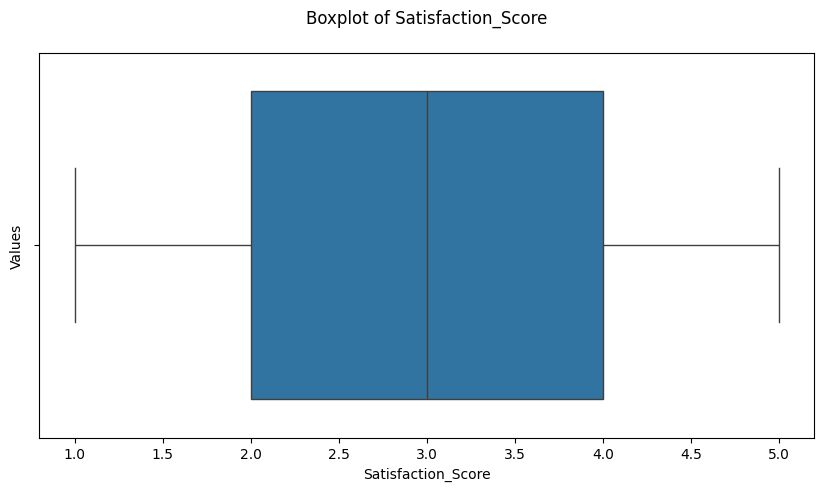

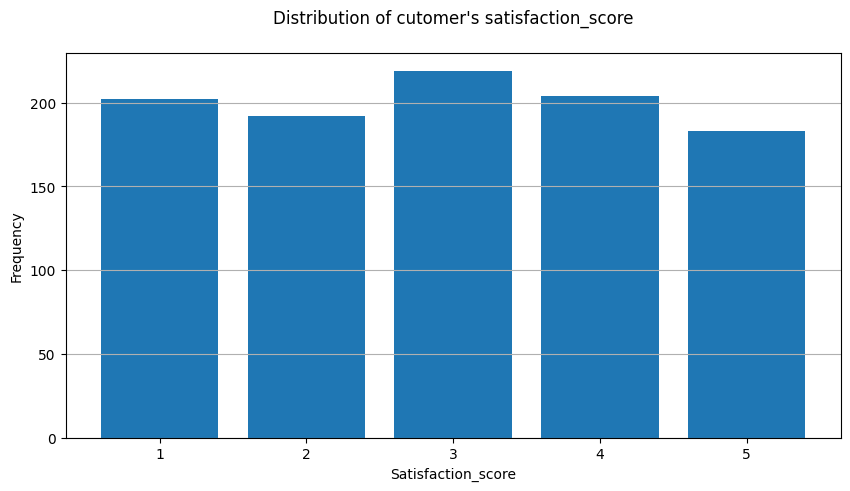

Distribution of cutomer's satisfaction_score: 2.97 ± 3.00 
Median: 3.00 
Minimum: 1 
Maximum: 5 

0.004 Skewness



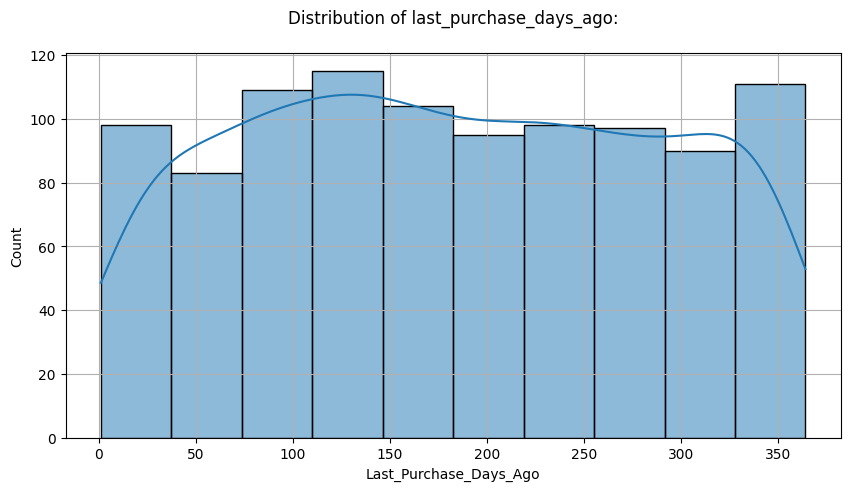

Distribution of last_purchase_days_ago: 182.89 ± 180.50 
Median: 180.50 
Minimum: 1 
Maximum: 364 
Skewness: 0.023



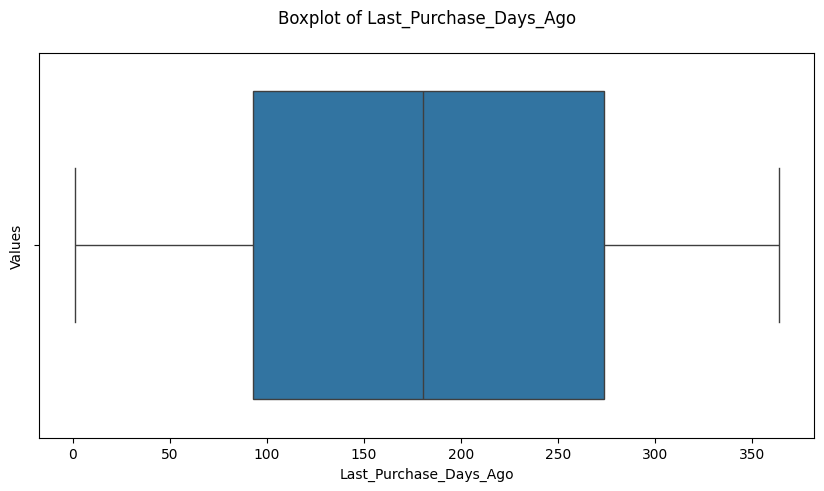

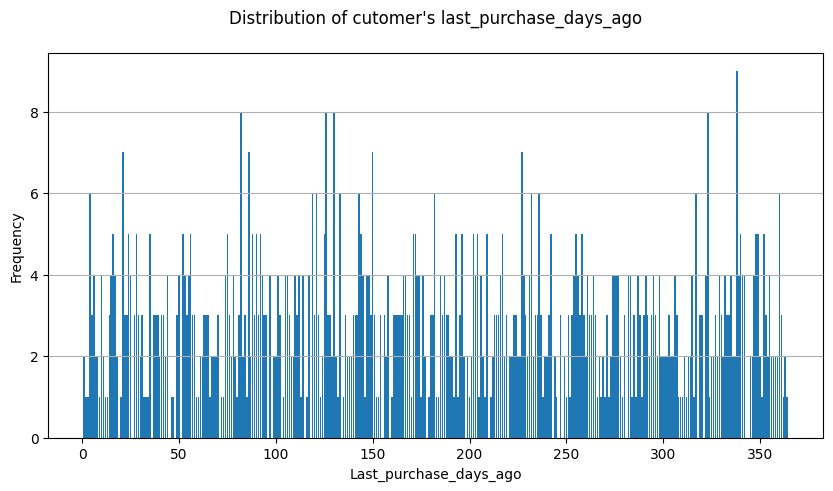

Distribution of cutomer's last_purchase_days_ago: 182.89 ± 180.50 
Median: 180.50 
Minimum: 1 
Maximum: 364 

0.023 Skewness



In [579]:
# Age
make_distplot(df, "Age")
make_boxplot(df, "Age")
make_barplot(df, "Age")

# Annual Income
make_distplot(df, "Annual_Income")
make_boxplot(df, "Annual_Income")
make_barplot(df, "Annual_Income")

# Total Spend
make_distplot(df, "Total_Spend")
make_boxplot(df, "Total_Spend")
make_barplot(df, "Total_Spend")

# Years as Customer
make_distplot(df, "Years_as_Customer")
make_boxplot(df, "Years_as_Customer")
make_barplot(df, "Years_as_Customer")

# Number of Purchases
make_distplot(df, "Num_of_Purchases")
make_boxplot(df, "Num_of_Purchases")
make_barplot(df, "Num_of_Purchases")

# Average Transaction Amount
make_distplot(df, "Average_Transaction_Amount")
make_boxplot(df, "Average_Transaction_Amount")
make_barplot(df, "Average_Transaction_Amount")

# Number of Returns
make_distplot(df, "Num_of_Returns")
make_boxplot(df, "Num_of_Returns")
make_barplot(df, "Num_of_Returns")

# Number of Support Contacts
make_distplot(df, "Num_of_Support_Contacts")
make_boxplot(df, "Num_of_Support_Contacts")
make_barplot(df, "Num_of_Support_Contacts")

# Satisfaction Score
make_distplot(df, "Satisfaction_Score")
make_boxplot(df, "Satisfaction_Score")
make_barplot(df, "Satisfaction_Score")

# Last Purchase Days Ago
make_distplot(df, "Last_Purchase_Days_Ago")
make_boxplot(df, "Last_Purchase_Days_Ago")
make_barplot(df, "Last_Purchase_Days_Ago")


# **Multivariate Analysis**

In [580]:
#  Categorical vs Numerical  (Boxplot / Violin with Hue)
def make_boxplot_hue(df, cat_col, num_col, hue_col=None):
    plt.figure(figsize=(8, 5))
    sns.boxplot(data=df, x=cat_col, y=num_col, hue=hue_col, palette='pastel')
    plt.title(f'{num_col} distribution by {cat_col}' + (f' and {hue_col}' if hue_col else ''), fontsize=14)
    plt.xlabel(cat_col)
    plt.ylabel(num_col)
    plt.tight_layout()
    plt.show()

# Numerical vs Categorical (Bar Plot of Aggregates)
def make_agg_barplot(df, num_feature, cat_feature, hue=None, agg='mean', additional=''):
    agg_df = df.groupby([cat_feature] + ([hue] if hue else []))[num_feature].agg(agg).reset_index()
    plt.figure(figsize=(10,5))
    sns.barplot(data=agg_df, x=cat_feature, y=num_feature, hue=hue, palette='bright')
    plt.title(f"{agg.capitalize()} {num_feature} by {cat_feature} {f'and {hue}' if hue else ''} {additional}")
    plt.xlabel(cat_feature)
    plt.ylabel(f"{agg.capitalize()} {num_feature}")
    plt.show()

# Categorical vs Categorical (Countplot / Stacked)
def make_countplot_bi(df, cat_feature, hue=None, palette='bright', additional=''):
    plt.figure(figsize=(10,5))
    sns.countplot(data=df, x=cat_feature, hue=hue, palette=palette)
    plt.xlabel(cat_feature)
    plt.ylabel('Count')
    plt.title(f"Distribution of {cat_feature}{f' by {hue}' if hue else ''} {additional}")
    plt.grid(axis='y')
    plt.show()



def make_category_target_pie(df, category_col, target_col):
    categories = df[category_col].unique()
    n = len(categories)
    fig, axes = plt.subplots(1, n, figsize=(6 * n, 5))
    if n == 1:
        axes = [axes]
    for i, cat in enumerate(categories):
        sub_df = df[df[category_col] == cat]
        churn_counts = sub_df[target_col].value_counts()
        labels = churn_counts.index.astype(str)
        values = churn_counts.values
        axes[i].pie(values, labels=labels, autopct='%1.1f%%', startangle=90, colors=['#ff9999', '#66b3ff'])
        axes[i].set_title(f'{category_col}: {cat}', fontsize=14)
    plt.suptitle(f'{target_col} Distribution by {category_col}', fontsize=16, y=1.05)
    plt.tight_layout()
    plt.show()



# Correlation Heatmap for numerical features
def make_correlation_heatmap(df, num_features, additional=''):
    corr = df[num_features].corr()
    plt.figure(figsize=(10,8))
    sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
    plt.title(f"Correlation Heatmap {additional}")
    plt.show()


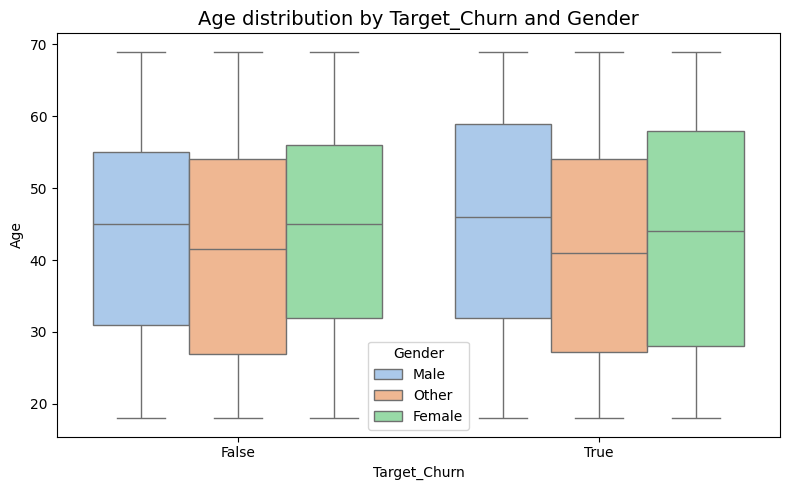

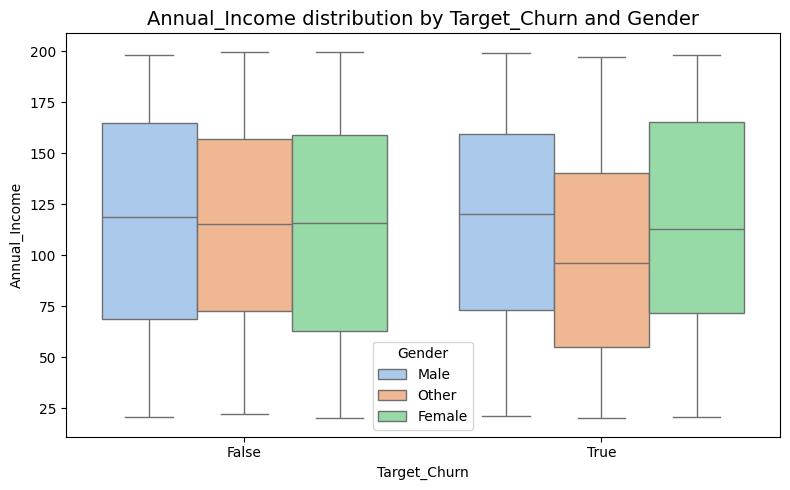

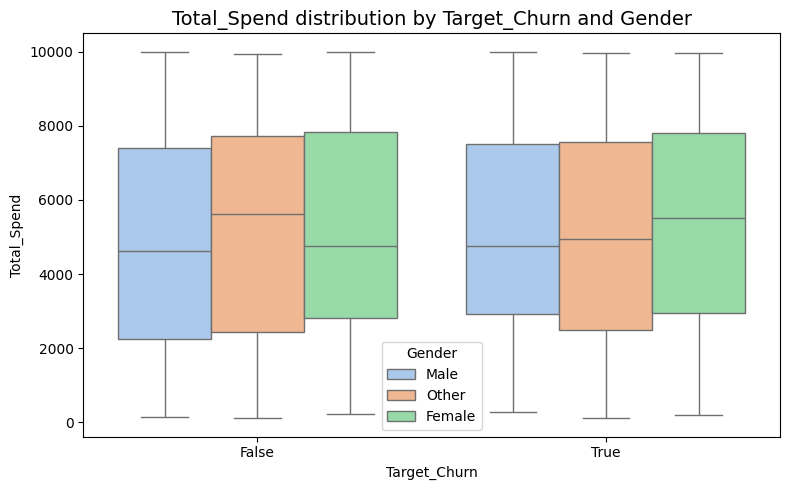

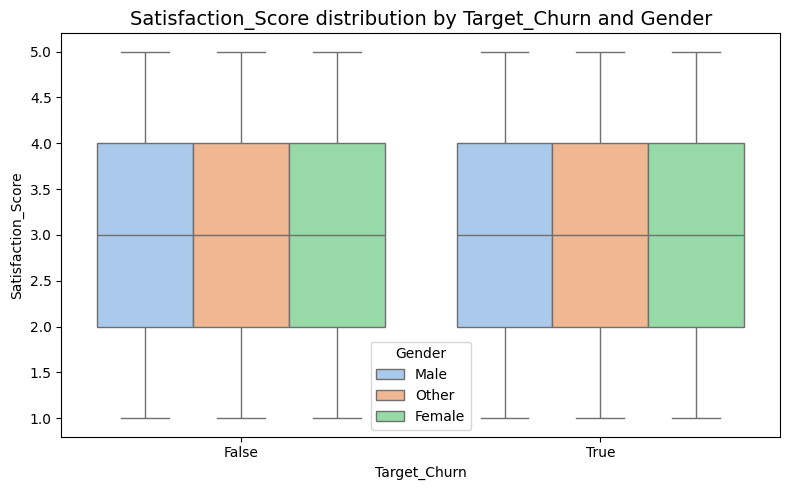

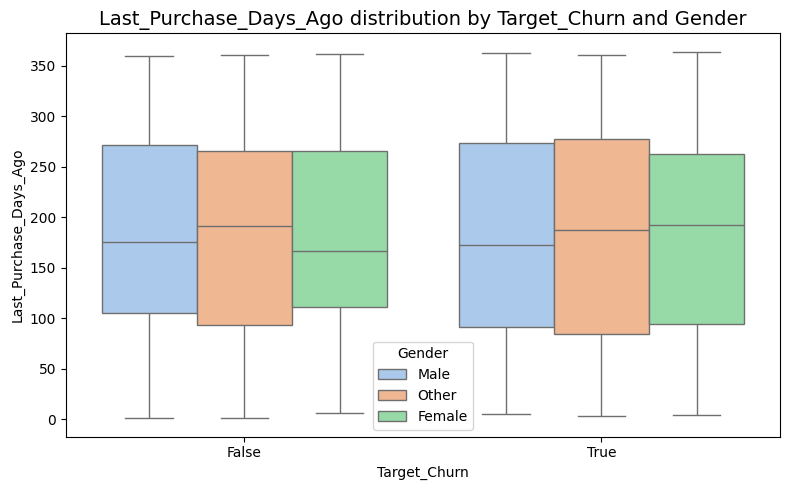

...

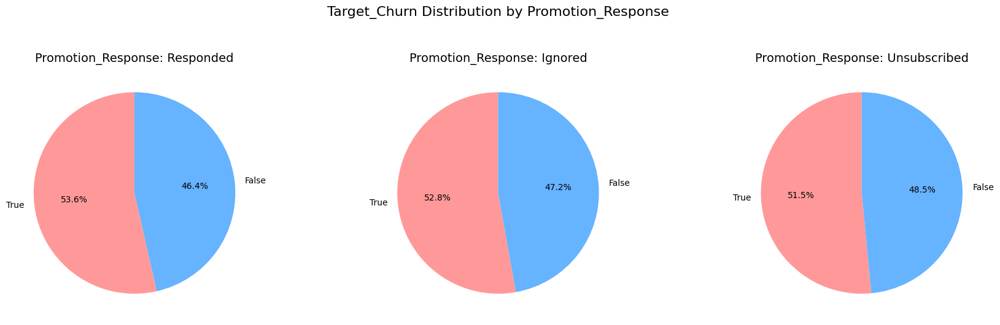

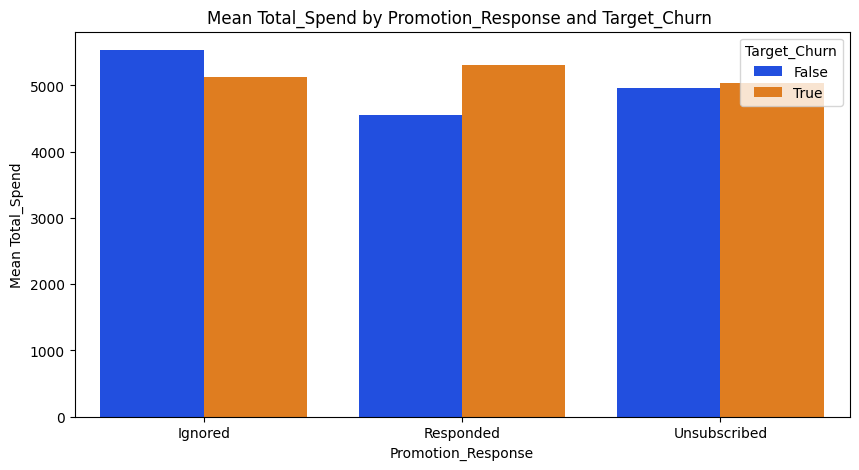

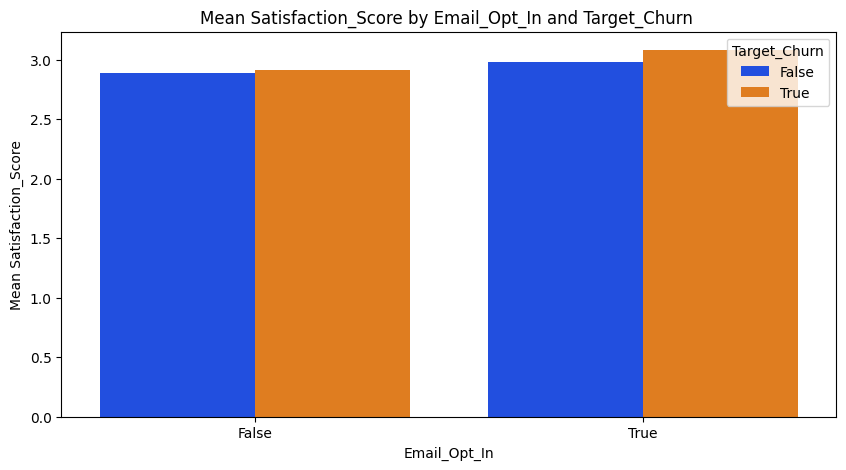

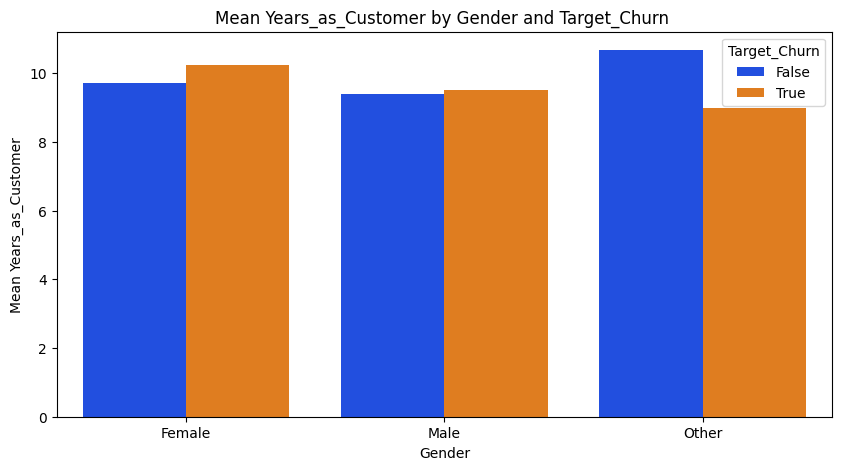

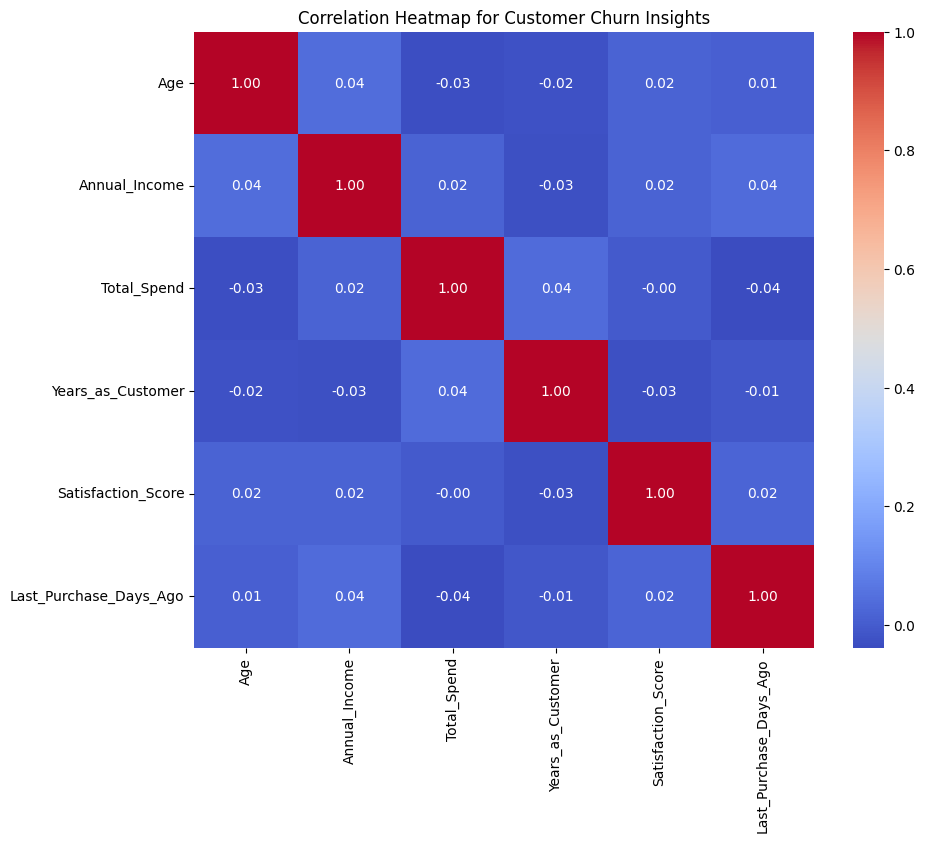

In [581]:
# Define feature groups
categorical_features = ['Gender', 'Email_Opt_In', 'Promotion_Response']
numerical_features = [
    'Age', 'Annual_Income', 'Total_Spend', 'Years_as_Customer',
    'Satisfaction_Score', 'Last_Purchase_Days_Ago'
]
target_col = 'Target_Churn'

# 1. Numerical vs Target (Boxplots)
# Compare churn vs non-churn across most influential numeric features
for col in ['Age', 'Annual_Income', 'Total_Spend', 'Satisfaction_Score', 'Last_Purchase_Days_Ago']:
    make_boxplot_hue(df, cat_col=target_col, num_col=col, hue_col='Gender')

# 2. Category vs Target (Countplots)
# Compare churn rates across key categorical variables
for cat_col in categorical_features:
    make_countplot_bi(df, cat_feature=cat_col, hue=target_col)

# 3. Categorical vs Target (Pie Distribution)
# Visualize churn distribution within each category
for cat_col in categorical_features:
    make_category_target_pie(df, category_col=cat_col, target_col=target_col)

# 4. Aggregated Numerical vs Category (Mean Spend, Satisfaction, etc.)
# Understand how engagement and satisfaction vary across groups
make_agg_barplot(df, num_feature='Total_Spend', cat_feature='Promotion_Response', hue=target_col, agg='mean')
make_agg_barplot(df, num_feature='Satisfaction_Score', cat_feature='Email_Opt_In', hue=target_col, agg='mean')
make_agg_barplot(df, num_feature='Years_as_Customer', cat_feature='Gender', hue=target_col, agg='mean')

# 5. Correlation Heatmap for numerical features
# Identify key correlated drivers of churn
make_correlation_heatmap(df, num_features=numerical_features, additional='for Customer Churn Insights')


In [582]:
df.sample(5)

,Customer_ID,Age,Gender,Annual_Income,Total_Spend,Years_as_Customer,Num_of_Purchases,Average_Transaction_Amount,Num_of_Returns,Num_of_Support_Contacts,Satisfaction_Score,Last_Purchase_Days_Ago,Email_Opt_In,Promotion_Response,Target_Churn
671,672,42,Other,199.68,3441.95,8,70,92.89,9,4,3,217,False,Responded,False
743,744,61,Female,88.34,9058.94,12,94,317.56,2,1,3,359,True,Ignored,False
440,441,24,Female,71.54,5366.48,5,10,352.17,1,1,5,288,True,Ignored,True
210,211,42,Other,54.85,7053.16,15,78,350.78,8,2,3,322,True,Responded,False
462,463,45,Male,54.51,1877.05,17,64,11.84,3,4,3,154,False,Ignored,False


# **Data preprocessing**

In [583]:
df.drop(columns=['Customer_ID'], inplace=True)

## Normalizaiton

In [584]:
scaler = MinMaxScaler()

num_cols = ['Age', 'Annual_Income', 'Total_Spend',
            'Years_as_Customer', 'Num_of_Purchases',
            'Average_Transaction_Amount', 'Num_of_Returns',
            'Num_of_Support_Contacts', 'Satisfaction_Score',
            'Last_Purchase_Days_Ago']

df[num_cols] = scaler.fit_transform(df[num_cols])


## Categorical column encoding

In [585]:
cat_cols = ['Gender', 'Promotion_Response']

encoder = OneHotEncoder(drop='first', sparse_output=False)
encoded_data = encoder.fit_transform(df[cat_cols])

encoded_df = pd.DataFrame(encoded_data, columns=encoder.get_feature_names_out(cat_cols))
df = pd.concat([df.drop(columns=cat_cols), encoded_df], axis=1)


In [586]:
df['Email_Opt_In'] = df['Email_Opt_In'].astype(int)
le = LabelEncoder()
df['Target_Churn'] = le.fit_transform(df['Target_Churn'])

# Train & Test Split

In [587]:
X = df.drop(columns=['Target_Churn'])
y = df['Target_Churn']

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

print(X_train.shape)
print(X_test.shape)

(800, 15)
(200, 15)


# **Training and Evaluation of Models**

In [588]:
from sklearn.metrics import (
    accuracy_score, roc_auc_score, confusion_matrix, classification_report,
    roc_curve, precision_recall_curve
)


def train_evaluate_model(model, X_train, X_test, y_train, y_test):
    # Train model
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # If model supports probability output, get predicted probabilities
    if hasattr(model, "predict_proba"):
        y_prob = model.predict_proba(X_test)[:, 1]
    else:
        # fallback for models without predict_proba (like SVM without probability=True)
        y_prob = y_pred

    # --- Print Key Metrics ---
    print(f"Model: {model.__class__.__name__}")
    print("Accuracy:", round(accuracy_score(y_test, y_pred), 4))
    print("ROC-AUC:", round(roc_auc_score(y_test, y_prob), 4))
    print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
    print("Classification Report:\n", classification_report(y_test, y_pred))
    print("-"*60)

    # --- Visualization 1: Confusion Matrix ---
    plt.figure(figsize=(5,4))
    sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.title(f"{model.__class__.__name__} - Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # --- Visualization 2: ROC Curve ---
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    plt.figure(figsize=(6,5))
    plt.plot(fpr, tpr, label=f"AUC = {roc_auc_score(y_test, y_prob):.3f}")
    plt.plot([0,1], [0,1], 'k--')
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(f"{model.__class__.__name__} - ROC Curve")
    plt.legend(loc='lower right')
    plt.show()

    # --- Visualization 3: Precision–Recall Curve ---
    precision, recall, _ = precision_recall_curve(y_test, y_prob)
    plt.figure(figsize=(6,5))
    plt.plot(recall, precision, color='green')
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title(f"{model.__class__.__name__} - Precision–Recall Curve")
    plt.show()


In [589]:
rf = RandomForestClassifier(n_estimators=200, random_state=42)
xgb = XGBClassifier(n_estimators=200, learning_rate=0.1, random_state=42, use_label_encoder=False, eval_metric='logloss')
lgbm = LGBMClassifier(n_estimators=200, learning_rate=0.1, random_state=42, verbose=-1)
lr = LogisticRegression(max_iter=1000, random_state=42)

Model: RandomForestClassifier
Accuracy: 0.485
ROC-AUC: 0.4686
Confusion Matrix:
 [[41 54]
 [49 56]]
Classification Report:
               precision    recall  f1-score   support

           0       0.46      0.43      0.44        95
           1       0.51      0.53      0.52       105

    accuracy                           0.48       200
   macro avg       0.48      0.48      0.48       200
weighted avg       0.48      0.48      0.48       200

------------------------------------------------------------


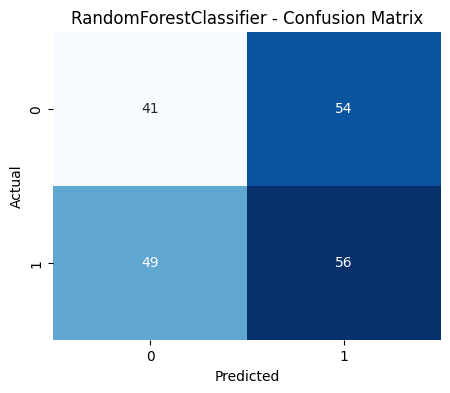

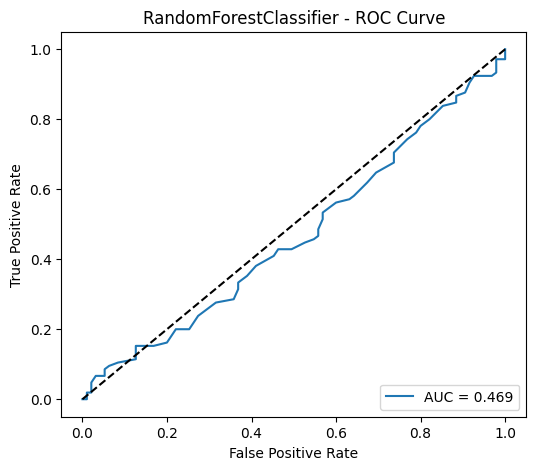

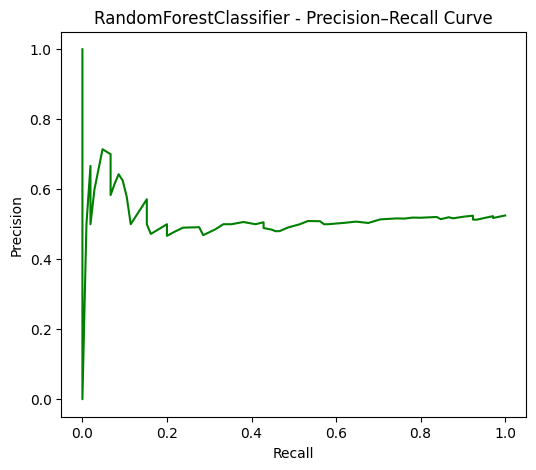

Model: XGBClassifier
Accuracy: 0.5
ROC-AUC: 0.475
Confusion Matrix:
 [[45 50]
 [50 55]]
Classification Report:
               precision    recall  f1-score   support

           0       0.47      0.47      0.47        95
           1       0.52      0.52      0.52       105

    accuracy                           0.50       200
   macro avg       0.50      0.50      0.50       200
weighted avg       0.50      0.50      0.50       200

------------------------------------------------------------


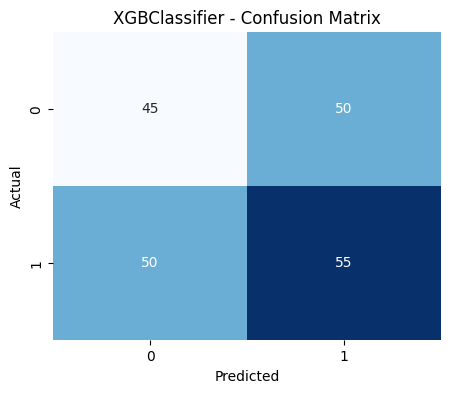

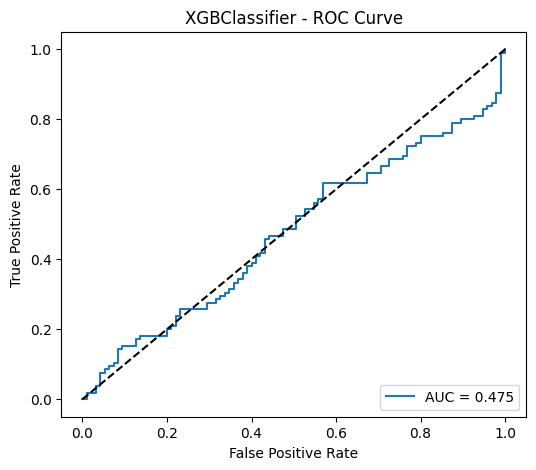

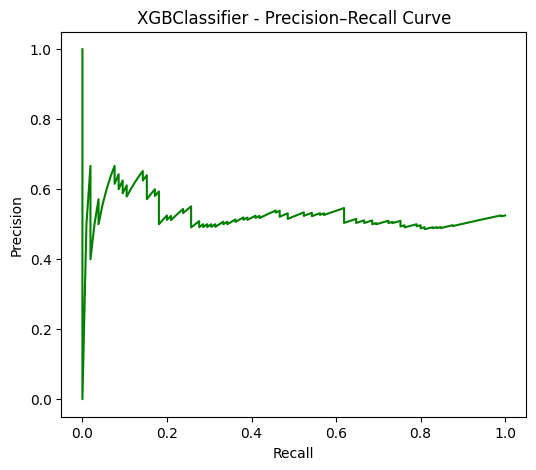

Model: LGBMClassifier
Accuracy: 0.54
ROC-AUC: 0.5227
Confusion Matrix:
 [[41 54]
 [38 67]]
Classification Report:
               precision    recall  f1-score   support

           0       0.52      0.43      0.47        95
           1       0.55      0.64      0.59       105

    accuracy                           0.54       200
   macro avg       0.54      0.53      0.53       200
weighted avg       0.54      0.54      0.54       200

------------------------------------------------------------


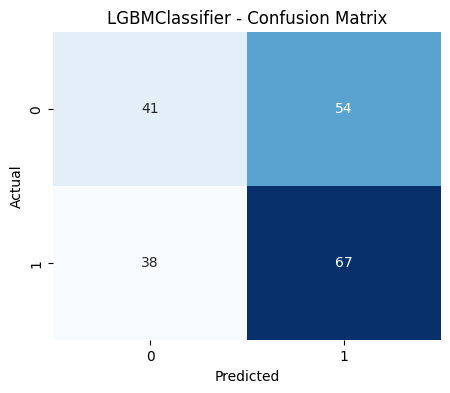

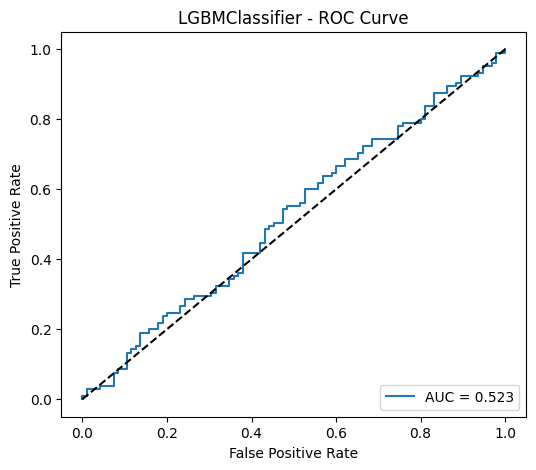

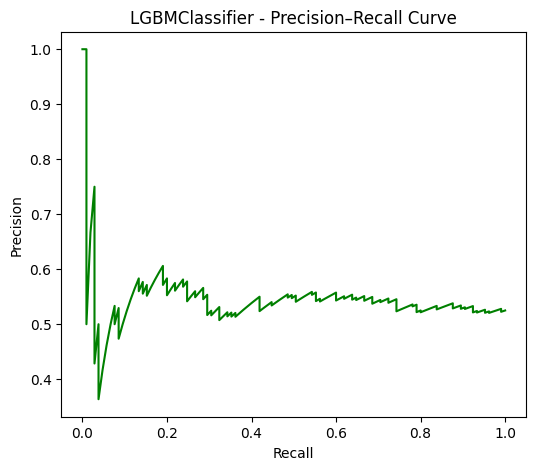

Model: LogisticRegression
Accuracy: 0.495
ROC-AUC: 0.4611
Confusion Matrix:
 [[27 68]
 [33 72]]
Classification Report:
               precision    recall  f1-score   support

           0       0.45      0.28      0.35        95
           1       0.51      0.69      0.59       105

    accuracy                           0.49       200
   macro avg       0.48      0.48      0.47       200
weighted avg       0.48      0.49      0.47       200

------------------------------------------------------------


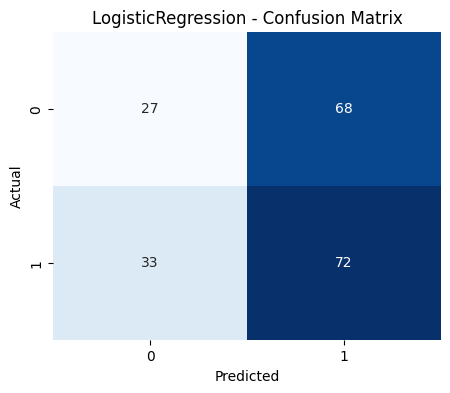

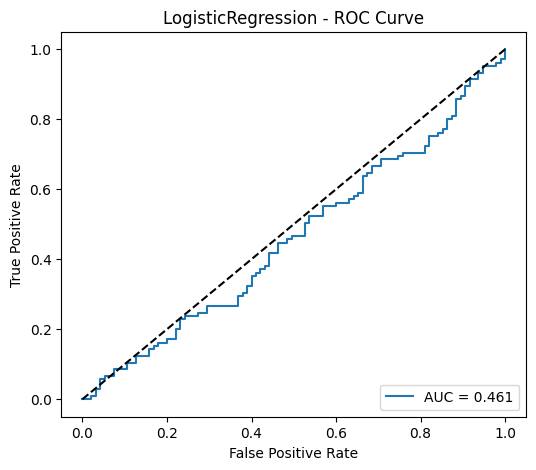

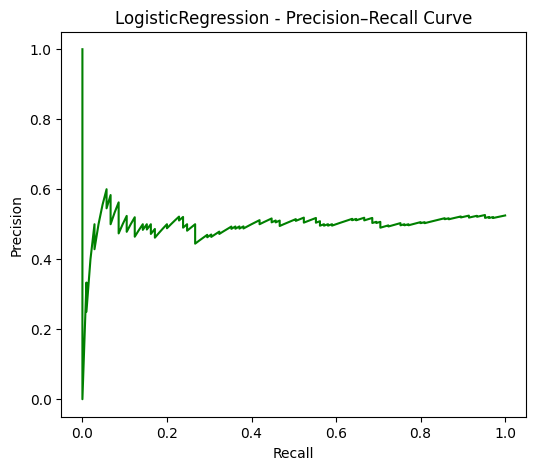

In [590]:
models = [rf, xgb, lgbm, lr]

for model in models:
    train_evaluate_model(model, X_train, X_test, y_train, y_test)


# **TabNet Neural Network Model**

In [591]:
from sklearn.metrics import  precision_recall_curve


# --- Original Code (unchanged) ---
X_train_tab, X_val_tab, y_train_tab, y_val_tab = train_test_split(
    X_train.values, y_train.values, test_size=0.2, random_state=42, stratify=y_train
)

model = TabNetClassifier()

model.fit(
    X_train_tab, y_train_tab,
    eval_set=[(X_val_tab, y_val_tab)],
    eval_name=['val'],
    eval_metric=['accuracy'],
    max_epochs=100,
    batch_size=50,
    drop_last=False
)




epoch 0  | loss: 0.76535 | val_accuracy: 0.54375 |  0:00:00s
epoch 1  | loss: 0.70417 | val_accuracy: 0.5     |  0:00:00s
epoch 2  | loss: 0.68809 | val_accuracy: 0.5625  |  0:00:01s
epoch 3  | loss: 0.6922  | val_accuracy: 0.51875 |  0:00:01s
epoch 4  | loss: 0.6813  | val_accuracy: 0.51875 |  0:00:01s
epoch 5  | loss: 0.6684  | val_accuracy: 0.525   |  0:00:01s
epoch 6  | loss: 0.67711 | val_accuracy: 0.525   |  0:00:02s
epoch 7  | loss: 0.67433 | val_accuracy: 0.55    |  0:00:02s
epoch 8  | loss: 0.67938 | val_accuracy: 0.51875 |  0:00:02s
epoch 9  | loss: 0.68612 | val_accuracy: 0.53125 |  0:00:02s
epoch 10 | loss: 0.68285 | val_accuracy: 0.54375 |  0:00:03s
epoch 11 | loss: 0.67918 | val_accuracy: 0.53125 |  0:00:03s
epoch 12 | loss: 0.67058 | val_accuracy: 0.5375  |  0:00:03s

Early stopping occurred at epoch 12 with best_epoch = 2 and best_val_accuracy = 0.5625


## Evaluation

Accuracy: 0.4850
ROC-AUC: 0.4664
Confusion Matrix:
[[ 9 86]
 [17 88]]
Classification Report:
              precision    recall  f1-score   support

           0       0.35      0.09      0.15        95
           1       0.51      0.84      0.63       105

    accuracy                           0.48       200
   macro avg       0.43      0.47      0.39       200
weighted avg       0.43      0.48      0.40       200



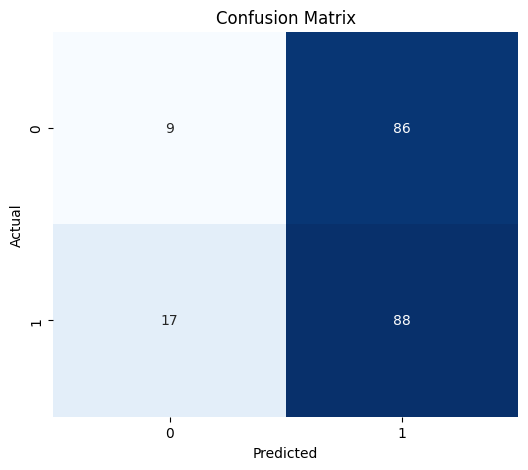

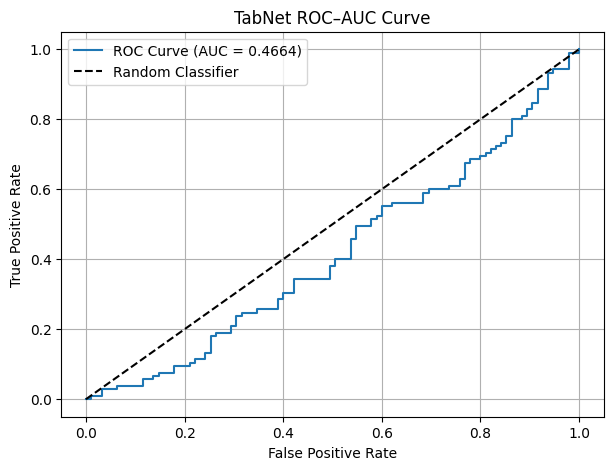

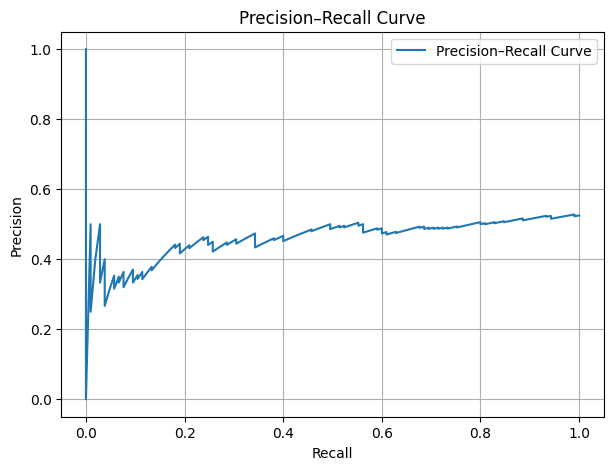

In [592]:
# Predict on the test set
y_pred = model.predict(X_test.values)
y_pred_proba = model.predict_proba(X_test.values)[:, 1]  # For ROC-AUC and PR curves

# Calculate metrics
accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

# Display results
print(f"Accuracy: {accuracy:.4f}")
print(f"ROC-AUC: {roc_auc:.4f}")
print("Confusion Matrix:")
print(conf_matrix)
print("Classification Report:")
print(class_report)


# --- Visualization 1: Confusion Matrix ---
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()


# --- Visualization 2: ROC–AUC Curve ---
fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
plt.figure(figsize=(7, 5))
plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {roc_auc:.4f})")
plt.plot([0, 1], [0, 1], 'k--', label="Random Classifier")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("TabNet ROC–AUC Curve")
plt.legend()
plt.grid(True)
plt.show()


# --- Visualization 3: Precision–Recall Curve ---
precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
plt.figure(figsize=(7, 5))
plt.plot(recall, precision, label="Precision–Recall Curve")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision–Recall Curve")
plt.legend()
plt.grid(True)
plt.show()





# **Simple ANN**

In [593]:
# ---  model ---
model = Sequential([
    Dense(64, activation='relu', kernel_regularizer=l2(0.01), input_shape=(X_train.shape[1],)),
    Dense(32, activation='relu', kernel_regularizer=l2(0.01)),
    Dense(1, activation='sigmoid')  # Binary classification
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# --- Train ---
history = model.fit(
    X_train, y_train,
    validation_split=0.2,
    epochs=50,
    batch_size=32,
    verbose=1
)

# --- Evaluate ---
y_pred_prob = model.predict(X_test).ravel()
y_pred = (y_pred_prob > 0.5).astype(int)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("ROC-AUC:", roc_auc_score(y_test, y_pred_prob))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Epoch 1/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - accuracy: 0.5428 - loss: 1.3486 - val_accuracy: 0.5000 - val_loss: 1.2608
Epoch 2/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5646 - loss: 1.2329 - val_accuracy: 0.5250 - val_loss: 1.1660
Epoch 3/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5410 - loss: 1.1433 - val_accuracy: 0.5063 - val_loss: 1.0877
Epoch 4/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5514 - loss: 1.0662 - val_accuracy: 0.4938 - val_loss: 1.0213
Epoch 5/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5909 - loss: 0.9991 - val_accuracy: 0.5437 - val_loss: 0.9679
Epoch 6/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5620 - loss: 0.9461 - val_accuracy: 0.5375 - val_loss: 0.9210
Epoch 7/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5484 - loss: 0.9026 - val_accuracy: 0.5375 - val_loss: 0.8832
Epoch 8/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5827 - loss: 0.8634 - val_accuracy: 0.5250 - val_loss

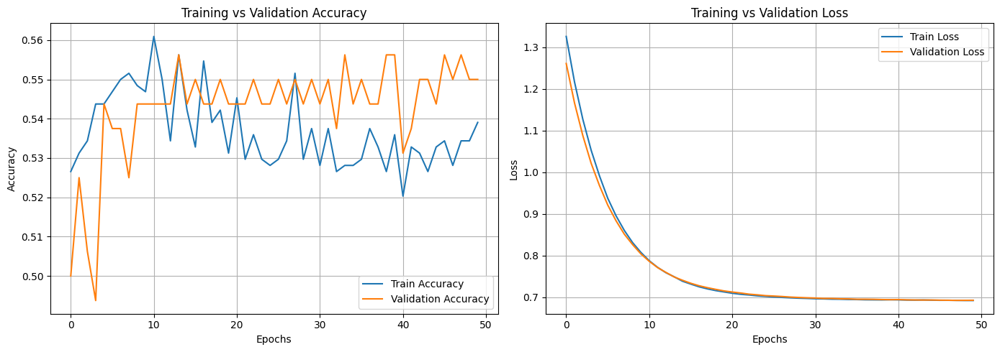

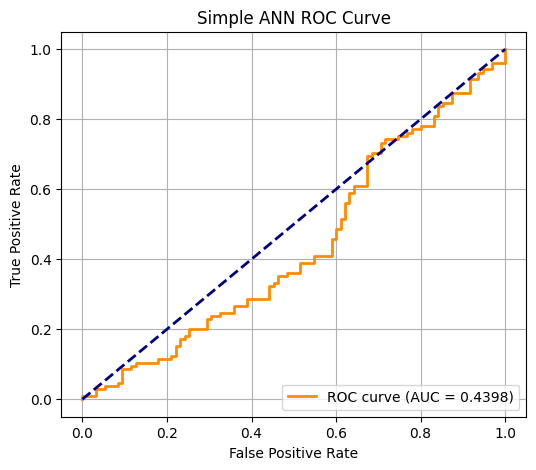

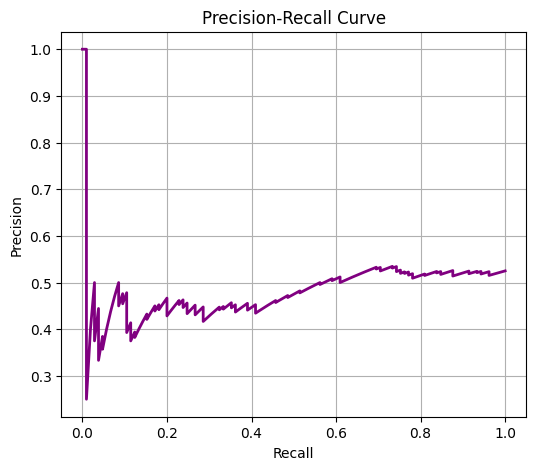

In [594]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, precision_recall_curve

# Training vs Validation Accuracy & Loss ---
plt.figure(figsize=(14,5))

# Accuracy
plt.subplot(1,2,1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss
plt.subplot(1,2,2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# ROC-AUC Curve ---
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6,5))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.4f})', color='darkorange', lw=2)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.title('Simple ANN ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

# Precision-Recall Curve ---
precision, recall, _ = precision_recall_curve(y_test, y_pred_prob)

plt.figure(figsize=(6,5))
plt.plot(recall, precision, color='purple', lw=2)
plt.title('Precision-Recall Curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.grid(True)
plt.show()


# **TabTransformer**

## Data Preparation

In [595]:
data = pd.read_csv(list(uploaded.keys())[0])


categorical_columns = ['Gender', 'Email_Opt_In', 'Promotion_Response']
numerical_columns = ['Age', 'Annual_Income', 'Total_Spend', 'Years_as_Customer',
                     'Num_of_Purchases', 'Average_Transaction_Amount',
                     'Num_of_Returns', 'Num_of_Support_Contacts',
                     'Satisfaction_Score', 'Last_Purchase_Days_Ago']


data['Target_Churn'] = le.fit_transform(df['Target_Churn'])
target_column = 'Target_Churn'
label_encoders = {}
for col in categorical_columns:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# --- Separate features and target ---
X_cat = data[categorical_columns].values
X_num = data[numerical_columns].values
y = data[target_column].astype(int).values  # Binary 0/1

# --- Normalize numerical features ---
scaler = StandardScaler()
X_num = scaler.fit_transform(X_num)

# --- Train-test split ---
X_cat_train, X_cat_test, X_num_train, X_num_test, y_train, y_test = train_test_split(
    X_cat, X_num, y, test_size=0.2, random_state=42
)

# --- Convert to torch tensors ---
X_cat_train = torch.LongTensor(X_cat_train)
X_cat_test = torch.LongTensor(X_cat_test)
X_num_train = torch.FloatTensor(X_num_train)
X_num_test = torch.FloatTensor(X_num_test)
y_train = torch.LongTensor(y_train)
y_test = torch.LongTensor(y_test)

## Model class

In [596]:
# --- TabTransformer model ---
class TabTransformer(nn.Module):
    def __init__(self, cat_dims, num_continuous, emb_dim=8, transformer_dim=64, num_heads=4, num_layers=2,
                 dropout=0.2, l2_reg=1e-4):
        super(TabTransformer, self).__init__()
        self.embeddings = nn.ModuleList([
            nn.Embedding(input_dim, emb_dim) for input_dim in cat_dims
        ])
        self.num_continuous = num_continuous
        self.input_dim = emb_dim * len(cat_dims) + num_continuous

        # Dropout
        self.dropout = nn.Dropout(dropout)

        # Transformer
        encoder_layer = nn.TransformerEncoderLayer(d_model=transformer_dim, nhead=num_heads, batch_first=True, dropout=dropout)
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

        # Projection from input to transformer dim with L2 regularization applied via optimizer weight decay
        self.input_projection = nn.Linear(self.input_dim, transformer_dim)

        # Classifier
        self.classifier = nn.Linear(transformer_dim, 1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x_cat, x_num):
        x_cat_emb = [emb(x_cat[:, i]) for i, emb in enumerate(self.embeddings)]
        x_cat_emb = torch.cat(x_cat_emb, dim=1)

        x = torch.cat([x_cat_emb, x_num], dim=1)
        x = self.dropout(x)
        x = self.input_projection(x)
        x = x.unsqueeze(1)  # seq_len=1
        x = self.transformer(x)
        x = x.mean(dim=1)
        x = self.dropout(x)
        x = self.classifier(x)
        x = self.sigmoid(x)
        return x


## Model initialization

In [597]:
# --- Model initialization ---
cat_dims = [len(data[col].unique()) for col in categorical_columns]
num_continuous = X_num_train.shape[1]

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = TabTransformer(cat_dims, num_continuous).to(device)

# --- Loss and optimizer ---
criterion = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-4)

## Training

In [598]:
# --- Training loop ---
X_cat_train = X_cat_train.to(device)
X_num_train = X_num_train.to(device)
y_train = y_train.to(device).float()

for epoch in range(100):
    model.train()
    optimizer.zero_grad()
    outputs = model(X_cat_train, X_num_train).squeeze()
    loss = criterion(outputs, y_train)
    loss.backward()
    optimizer.step()

    if epoch % 5 == 0 or epoch == 49:
        with torch.no_grad():
            batch_pred = (outputs > 0.5).int()
            batch_acc = (batch_pred == y_train.int()).float().mean()
        print(f"Epoch {epoch+1:02d}/50 - Loss: {loss.item():.4f} - Accuracy: {batch_acc.item():.4f}")

Epoch 01/50 - Loss: 0.7365 - Accuracy: 0.5063
Epoch 06/50 - Loss: 0.6991 - Accuracy: 0.4787
Epoch 11/50 - Loss: 0.6908 - Accuracy: 0.5462
Epoch 16/50 - Loss: 0.6967 - Accuracy: 0.5238
Epoch 21/50 - Loss: 0.6958 - Accuracy: 0.5250
Epoch 26/50 - Loss: 0.6895 - Accuracy: 0.5412
Epoch 31/50 - Loss: 0.6926 - Accuracy: 0.5025
Epoch 36/50 - Loss: 0.6891 - Accuracy: 0.5425
Epoch 41/50 - Loss: 0.6846 - Accuracy: 0.5400
Epoch 46/50 - Loss: 0.6869 - Accuracy: 0.5437
Epoch 50/50 - Loss: 0.6801 - Accuracy: 0.5688
Epoch 51/50 - Loss: 0.6868 - Accuracy: 0.5550
Epoch 56/50 - Loss: 0.6821 - Accuracy: 0.5400
Epoch 61/50 - Loss: 0.6701 - Accuracy: 0.5913
Epoch 66/50 - Loss: 0.6679 - Accuracy: 0.6037
Epoch 71/50 - Loss: 0.6587 - Accuracy: 0.5987
Epoch 76/50 - Loss: 0.6708 - Accuracy: 0.5713
Epoch 81/50 - Loss: 0.6588 - Accuracy: 0.6062
Epoch 86/50 - Loss: 0.6577 - Accuracy: 0.5938
Epoch 91/50 - Loss: 0.6413 - Accuracy: 0.6463
Epoch 96/50 - Loss: 0.6418 - Accuracy: 0.6288


## Evaluation

In [599]:
model.eval()
X_cat_test = X_cat_test.to(device)
X_num_test = X_num_test.to(device)
y_test = y_test.to(device).float()

with torch.no_grad():
    preds = model(X_cat_test, X_num_test).squeeze()
    y_pred = (preds > 0.5).int()

    y_true = y_test.int().cpu().numpy()
    y_pred_np = y_pred.cpu().numpy()
    y_pred_prob = preds.cpu().numpy()

    acc = accuracy_score(y_true, y_pred_np)
    roc_auc = roc_auc_score(y_true, y_pred_prob)


    print(f"Accuracy: {acc:.4f}")
    print(f"ROC-AUC: {roc_auc:.4f}")
    print("\nConfusion Matrix:\n", confusion_matrix(y_true, y_pred_np))
    print("\nClassification Report:\n", classification_report(y_true, y_pred_np))


Accuracy: 0.5650
ROC-AUC: 0.5584

Confusion Matrix:
 [[56 38]
 [49 57]]

Classification Report:
               precision    recall  f1-score   support

           0       0.53      0.60      0.56        94
           1       0.60      0.54      0.57       106

    accuracy                           0.56       200
   macro avg       0.57      0.57      0.56       200
weighted avg       0.57      0.56      0.57       200



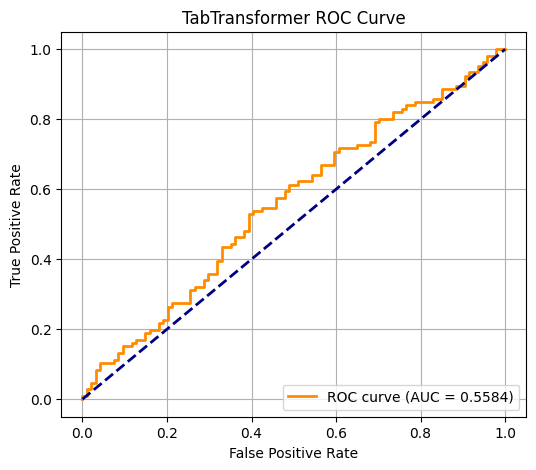

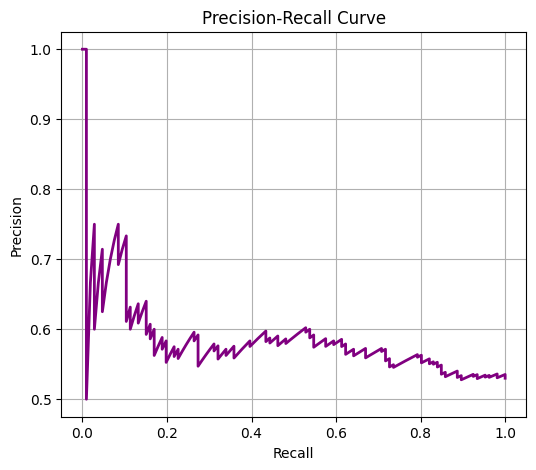

In [600]:
# --- ROC-AUC Curve ---
fpr, tpr, _ = roc_curve(y_true, y_pred_prob)
roc_auc_val = auc(fpr, tpr)

plt.figure(figsize=(6,5))
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc_val:.4f})', color='darkorange', lw=2)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.title('TabTransformer ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

# --- Precision-Recall Curve ---
precision, recall, _ = precision_recall_curve(y_true, y_pred_prob)

plt.figure(figsize=(6,5))
plt.plot(recall, precision, color='purple', lw=2)
plt.title('Precision-Recall Curve')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.grid(True)
plt.show()
